Importing Libraries

In [146]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import (accuracy_score, classification_report, confusion_matrix, 
                             PrecisionRecallDisplay)
import seaborn as sns
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV
from skopt import BayesSearchCV
import warnings
import xgboost as xgb
from sklearn.tree import export_text

Importing Dataset

In [32]:
dataset = pd.read_csv('Customer_Churn.csv')

Suspected Outliers Analysis

In [11]:
# Select the relevant columns based on the initial code
column_0 = dataset.iloc[:, 0]
column_4 = dataset.iloc[:, 5]
column_12 = dataset.iloc[:, 12]
column_13 = dataset.iloc[:, 13]

# Filter records based on specified conditions and get the indices
filtered_rows = dataset[(column_4 == 0) & (column_13 == 1) & (column_0 == 0)]

# Calculate global statistics for each of the specified columns
stats = {
    'mean': dataset.mean(),
    'median': dataset.median(),
    'std': dataset.std(),
    'min': dataset.min(),
    'max': dataset.max()
}

# Display statistics for reference
print("Global Dataset Statistics:")
print(pd.DataFrame(stats))

# Function to identify how far each value in the filtered rows is from the dataset’s overall stats
def compare_to_global_stats(row, global_stats):
    deviations = {}
    for column in row.index:
        deviations[column] = {
            'value': row[column],
            'deviation_from_mean': row[column] - global_stats['mean'][column],
            'deviation_from_median': row[column] - global_stats['median'][column],
            'std_dev_from_mean': (row[column] - global_stats['mean'][column]) / global_stats['std'][column] if global_stats['std'][column] != 0 else 0
        }
    return deviations

# Compare each row in the filtered dataset to the global statistics and display the results
outlier_analysis = []
for idx, row in filtered_rows.iterrows():
    print(f"\nAnalysis for Row Index {idx}:")
    deviations = compare_to_global_stats(row, stats)
    outlier_analysis.append(deviations)
    print(pd.DataFrame(deviations).transpose())



Global Dataset Statistics:
                                mean   median          std   min       max
Call  Failure               7.627937     6.00     7.263886   0.0     36.00
Complains                   0.076508     0.00     0.265851   0.0      1.00
Subscription  Length       32.541905    35.00     8.573482   3.0     47.00
Charge  Amount              0.942857     0.00     1.521072   0.0     10.00
Seconds of Use           4472.459683  2990.00  4197.908687   0.0  17090.00
Frequency of use           69.460635    54.00    57.413308   0.0    255.00
Frequency of SMS           73.174921    21.00   112.237560   0.0    522.00
Distinct Called Numbers    23.509841    21.00    17.217337   0.0     97.00
Age Group                   2.826032     3.00     0.892555   1.0      5.00
Tariff Plan                 1.077778     1.00     0.267864   1.0      2.00
Status                      1.248254     1.00     0.432069   1.0      2.00
Age                        30.998413    30.00     8.831095  15.0     55.0

Creating the First Set of Training and Test Set without any Implementations

In [14]:
# Define feature columns (X) and target column (y)
X = dataset.iloc[:, :-1].values  
y = dataset.iloc[:, -1].values

# Split the dataset into training and testing sets
def custom_train_test_split(X, y, test_size=0.2, stratify=None, random_state=None):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=stratify, random_state=random_state)
    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = custom_train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Function to print class proportions
def print_proportions(y):
    unique, counts = np.unique(y, return_counts=True)
    total = len(y)
    for val, count in zip(unique, counts):
        print(f"Class {val}: {count} ({count/total*100:.1f}%)")

print("\nTraining set proportions:")
print_proportions(y_train)
print("\nTest set proportions:")
print_proportions(y_test)


Training set proportions:
Class 0: 2124 (84.3%)
Class 1: 396 (15.7%)

Test set proportions:
Class 0: 531 (84.3%)
Class 1: 99 (15.7%)


Running Desicion Trees on Default Data

Results for CART Classifier (Gini):
Accuracy: 0.93
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.96       531
           1       0.77      0.76      0.77        99

    accuracy                           0.93       630
   macro avg       0.86      0.86      0.86       630
weighted avg       0.93      0.93      0.93       630



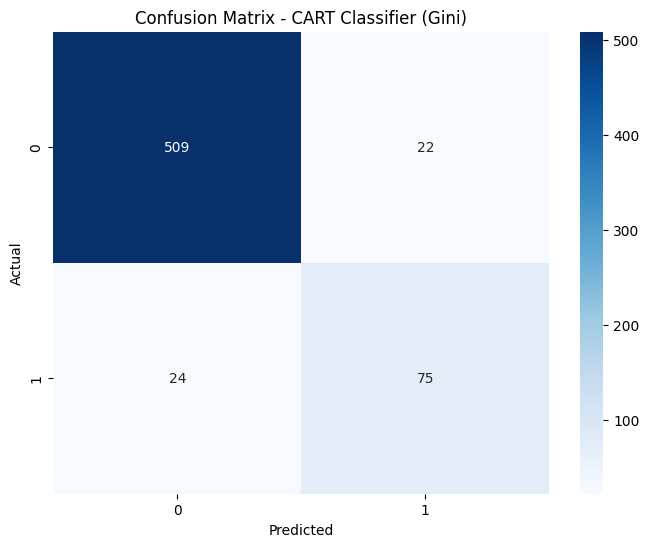

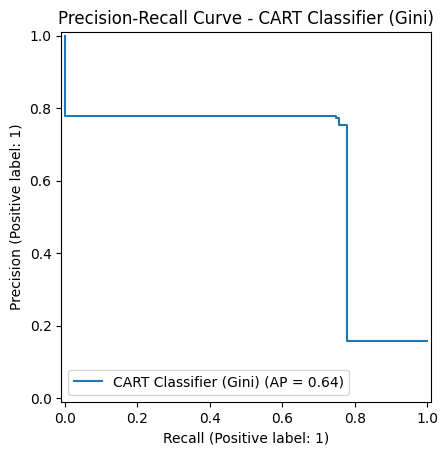

Example Results (Actual vs Predicted) for CART Classifier (Gini): [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 1)]


Results for ID3 Classifier (Entropy):
Accuracy: 0.95
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97       531
           1       0.84      0.83      0.83        99

    accuracy                           0.95       630
   macro avg       0.90      0.90      0.90       630
weighted avg       0.95      0.95      0.95       630



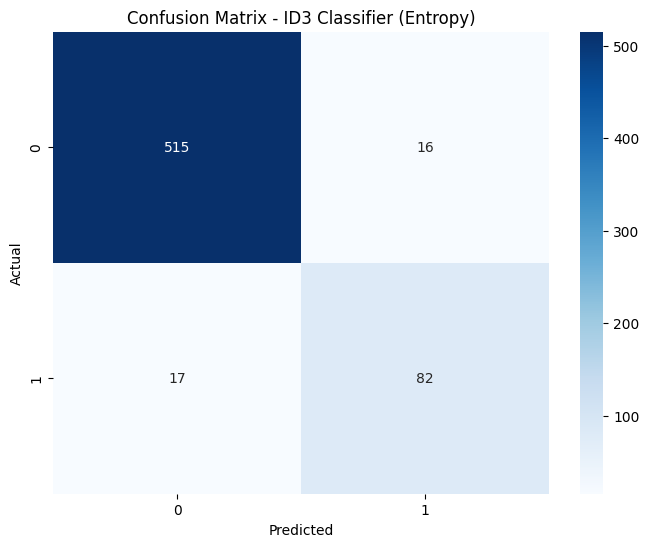

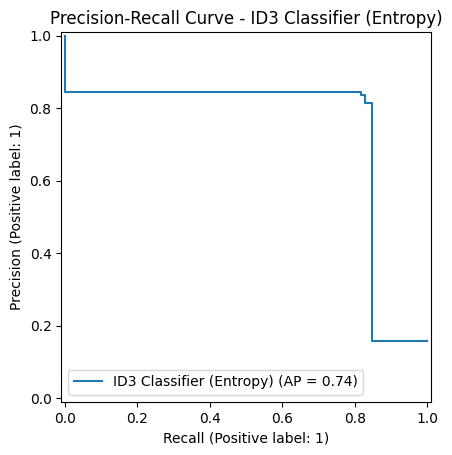

Example Results (Actual vs Predicted) for ID3 Classifier (Entropy): [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for C4.5 Classifier Approximation:
Accuracy: 0.95
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97       531
           1       0.84      0.83      0.83        99

    accuracy                           0.95       630
   macro avg       0.90      0.90      0.90       630
weighted avg       0.95      0.95      0.95       630



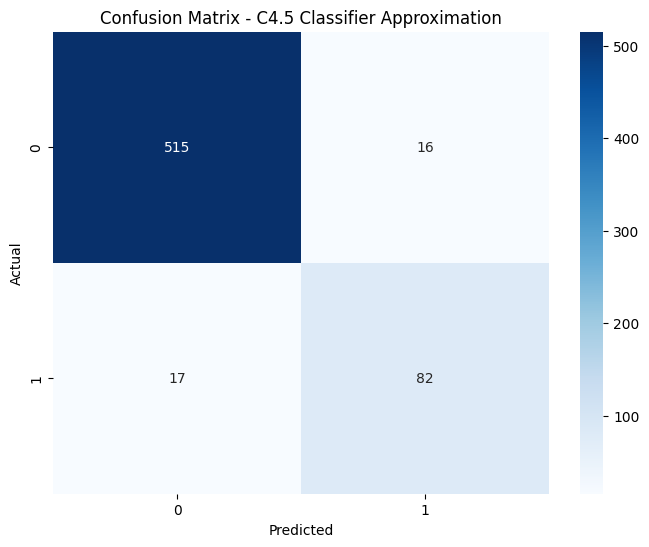

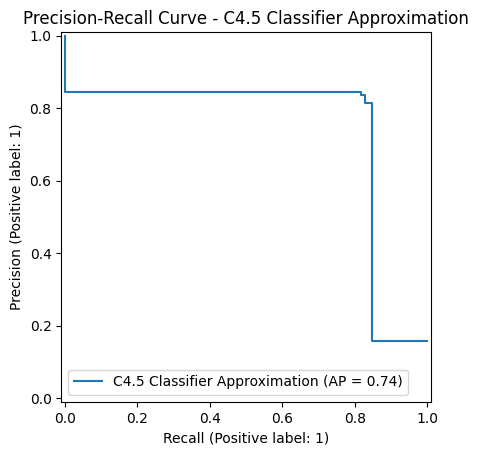

Example Results (Actual vs Predicted) for C4.5 Classifier Approximation: [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Extra Tree Classifier:
Accuracy: 0.93
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96       531
           1       0.79      0.77      0.78        99

    accuracy                           0.93       630
   macro avg       0.87      0.87      0.87       630
weighted avg       0.93      0.93      0.93       630



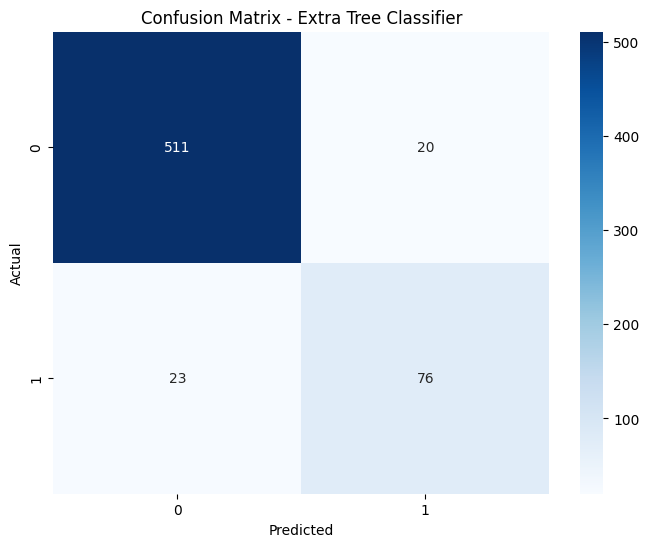

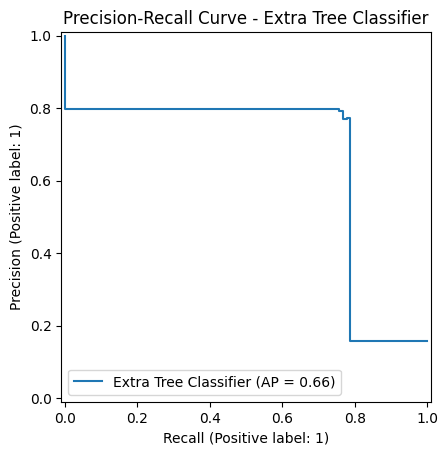

Example Results (Actual vs Predicted) for Extra Tree Classifier: [(0, 1), (0, 0), (0, 0), (0, 0), (0, 0), (1, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Random Forest Classifier:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.98      0.98       531
           1       0.89      0.86      0.88        99

    accuracy                           0.96       630
   macro avg       0.93      0.92      0.93       630
weighted avg       0.96      0.96      0.96       630



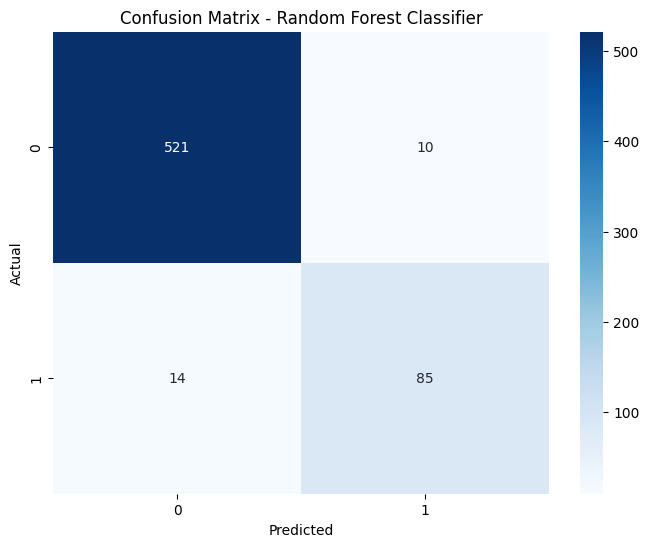

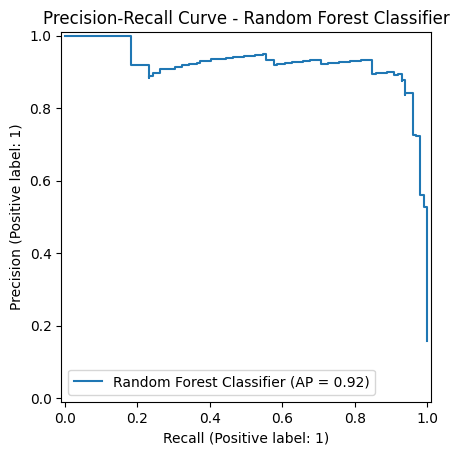

Example Results (Actual vs Predicted) for Random Forest Classifier: [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Gradient Boosting Classifier:
Accuracy: 0.95
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.98      0.97       531
           1       0.88      0.78      0.82        99

    accuracy                           0.95       630
   macro avg       0.92      0.88      0.90       630
weighted avg       0.95      0.95      0.95       630



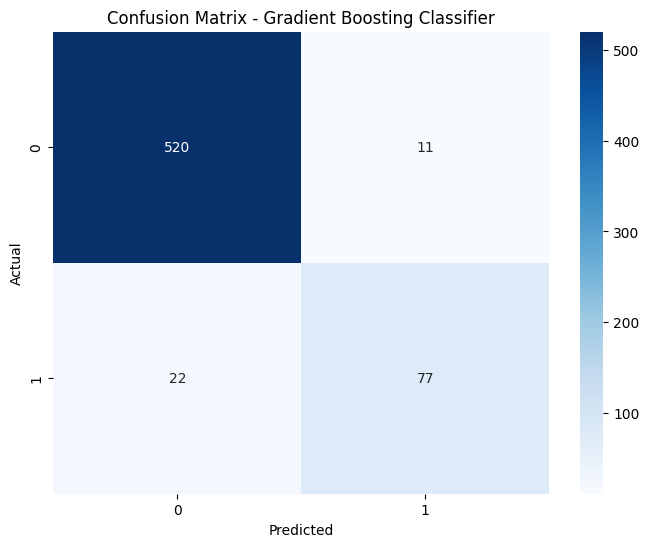

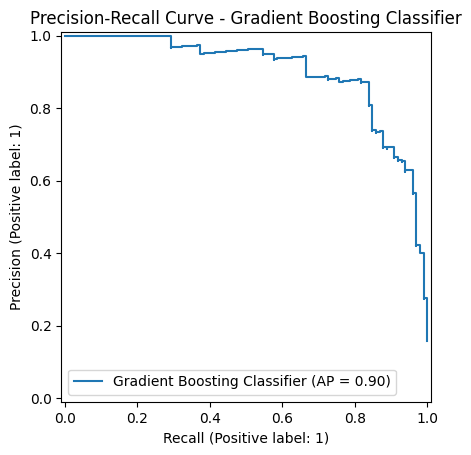

Example Results (Actual vs Predicted) for Gradient Boosting Classifier: [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0)]




c:\Users\Administrator\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Results for AdaBoost Classifier with Decision Tree:
Accuracy: 0.94
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.96      0.96       531
           1       0.80      0.82      0.81        99

    accuracy                           0.94       630
   macro avg       0.88      0.89      0.89       630
weighted avg       0.94      0.94      0.94       630



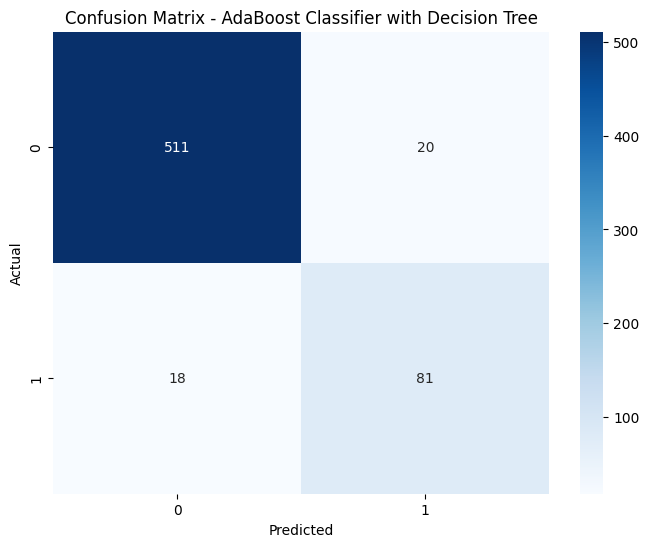

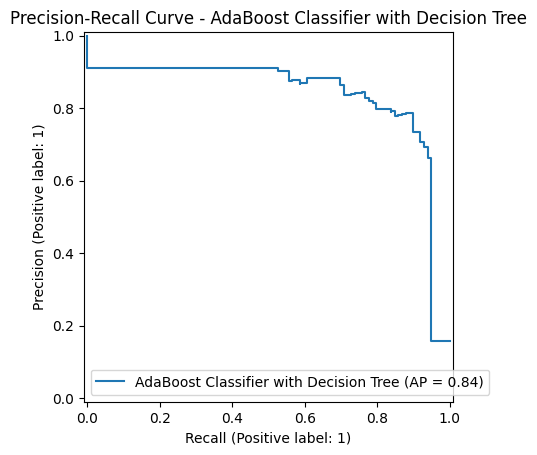

Example Results (Actual vs Predicted) for AdaBoost Classifier with Decision Tree: [(0, 1), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for XGBoost Classifier:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       531
           1       0.88      0.89      0.88        99

    accuracy                           0.96       630
   macro avg       0.93      0.93      0.93       630
weighted avg       0.96      0.96      0.96       630



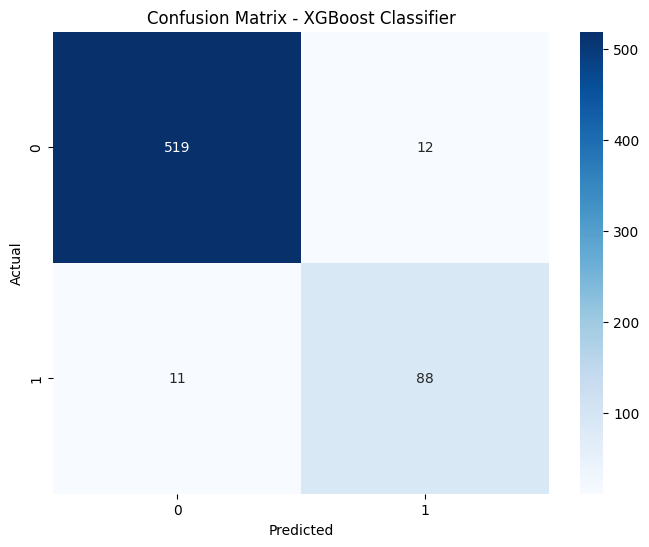

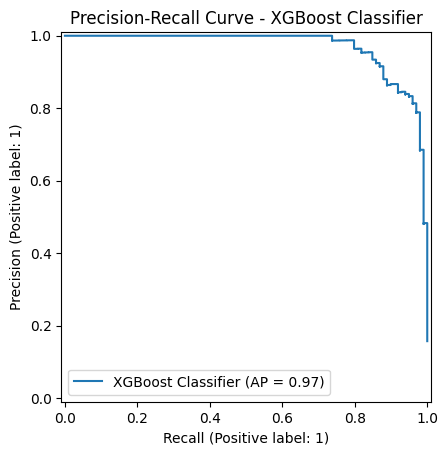

Example Results (Actual vs Predicted) for XGBoost Classifier: [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0)]




In [15]:


# Function to train and evaluate a model
def train_and_evaluate_model(model, model_name):
    # Train the model
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Display Accuracy and Classification Report
    accuracy = accuracy_score(y_test, y_pred)
    class_report = classification_report(y_test, y_pred)
    
    print(f"Results for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print("Classification Report:\n", class_report)
    
    # Plot Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Plot Precision-Recall Curve
    try:
        y_pred_proba = model.predict_proba(X_test)[:, 1]
        display = PrecisionRecallDisplay.from_predictions(y_test, y_pred_proba, name=model_name)
        display.ax_.set_title(f"Precision-Recall Curve - {model_name}")
        plt.show()
    except AttributeError:
        print(f"Warning: {model_name} does not support probability predictions.")
    
    # Example Output
    example = list(zip(y_test[:10], y_pred[:10]))  # Display the first 10 actual vs predicted
    print(f"Example Results (Actual vs Predicted) for {model_name}: {example}")
    
    print("\n" + "="*50 + "\n")

# 1. CART (Classification and Regression Tree) - Gini impurity
cart_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)
train_and_evaluate_model(cart_classifier, "CART Classifier (Gini)")

# 2. ID3 - Approximated using entropy as the criterion
id3_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
train_and_evaluate_model(id3_classifier, "ID3 Classifier (Entropy)")

# 3. C4.5 - Approximated using entropy, similar to ID3
c4_5_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
train_and_evaluate_model(c4_5_classifier, "C4.5 Classifier Approximation")

# 4. Extra Tree Classifier (another variant of decision trees)
extra_tree_classifier = ExtraTreeClassifier(random_state=42)
train_and_evaluate_model(extra_tree_classifier, "Extra Tree Classifier")

# 5. Random Forest Classifier
random_forest_classifier = RandomForestClassifier(random_state=42)
train_and_evaluate_model(random_forest_classifier, "Random Forest Classifier")

# 6. Gradient Boosting Classifier
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)
train_and_evaluate_model(gradient_boosting_classifier, "Gradient Boosting Classifier")

# 7. AdaBoost Classifier (with a Decision Tree as the base estimator)
adaboost_classifier = AdaBoostClassifier(estimator=DecisionTreeClassifier(), random_state=42)
train_and_evaluate_model(adaboost_classifier, "AdaBoost Classifier with Decision Tree")

# 8. XGBoost Classifier
xgb_classifier = xgb.XGBClassifier(random_state=42)
train_and_evaluate_model(xgb_classifier, "XGBoost Classifier")


Finding the Possible Outlier Records

In [74]:
# Access relevant columns
column_0 = dataset.iloc[:, 0]
column_4 = dataset.iloc[:, 4]  
column_5 = dataset.iloc[:, 5]
column_13 = dataset.iloc[:, 13]

# Calculate zero counts and indices for Churn value 0
zero_count_ch0 = ((column_0 == 0) & (column_4 == 0) & (column_5 == 0) & (column_13 == 0)).sum()
print(f"Number of records with Churn value 0 in specified columns: {zero_count_ch0}")

zero_indices_ch0 = dataset[((column_0 == 0) & (column_4 == 0) & (column_5 == 0) & (column_13 == 0))].index.tolist()
print(f"Index of records with Churn value 0 in specified columns: {zero_indices_ch0}")

# Calculate zero counts and indices for Churn value 1
zero_count_ch1 = ((column_0 == 0) & (column_4 == 0) & (column_5 == 0) & (column_13 == 1)).sum()
print(f"Number of records with Churn value 1 in specified columns: {zero_count_ch1}")

zero_indices_ch1 = dataset[((column_0 == 0) & (column_4 == 0) & (column_5 == 0) & (column_13 == 1))].index.tolist()
print(f"Index of records with Churn value 1 in specified columns: {zero_indices_ch1}")





Number of records with Churn value 0 in specified columns: 73
Index of records with Churn value 0 in specified columns: [132, 201, 232, 241, 301, 329, 341, 401, 432, 441, 501, 532, 541, 601, 632, 732, 901, 917, 932, 940, 941, 1051, 1082, 1151, 1182, 1191, 1232, 1251, 1282, 1291, 1351, 1366, 1367, 1379, 1390, 1391, 1451, 1466, 1467, 1479, 1482, 1491, 1551, 1566, 1567, 1579, 1582, 1590, 1591, 1592, 1594, 1651, 1682, 1691, 1701, 1732, 1751, 1782, 1791, 1801, 1832, 1951, 1966, 1967, 1982, 1990, 1991, 2001, 2032, 2051, 2082, 3001, 3032]
Number of records with Churn value 1 in specified columns: 81
Index of records with Churn value 1 in specified columns: [18, 118, 128, 218, 228, 231, 318, 328, 331, 332, 418, 428, 431, 518, 528, 531, 618, 628, 718, 728, 768, 778, 818, 918, 928, 931, 968, 1018, 1068, 1078, 1118, 1128, 1168, 1178, 1218, 1228, 1268, 1278, 1281, 1318, 1368, 1378, 1381, 1382, 1399, 1418, 1468, 1478, 1481, 1568, 1578, 1581, 1599, 1618, 1628, 1668, 1678, 1681, 1718, 1728, 1768, 177

Droping the Outlier Records with 1 for Churn Value

In [68]:

dataset = dataset.drop(index=zero_indices_ch1)

Creating the Set of Training and Test Set without Outliers with 1 for Churn Value

In [36]:
# Define feature columns (X) and target column (y)
X = dataset.iloc[:, :-1].values  
y = dataset.iloc[:, -1].values

# Split the dataset into training and testing sets
def custom_train_test_split(X, y, test_size=0.2, stratify=None, random_state=None):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=stratify, random_state=random_state)
    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = custom_train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Function to print class proportions
def print_proportions(y):
    unique, counts = np.unique(y, return_counts=True)
    total = len(y)
    for val, count in zip(unique, counts):
        print(f"Class {val}: {count} ({count/total*100:.1f}%)")

print("\nTraining set proportions:")
print_proportions(y_train)
print("\nTest set proportions:")
print_proportions(y_test)


Training set proportions:
Class 0: 2124 (86.5%)
Class 1: 331 (13.5%)

Test set proportions:
Class 0: 531 (86.5%)
Class 1: 83 (13.5%)


Running Desicion Trees on Dataset without Outliers with 1 for Churn Value

Results for CART Classifier (Gini):
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       531
           1       0.88      0.84      0.86        83

    accuracy                           0.96       614
   macro avg       0.93      0.91      0.92       614
weighted avg       0.96      0.96      0.96       614



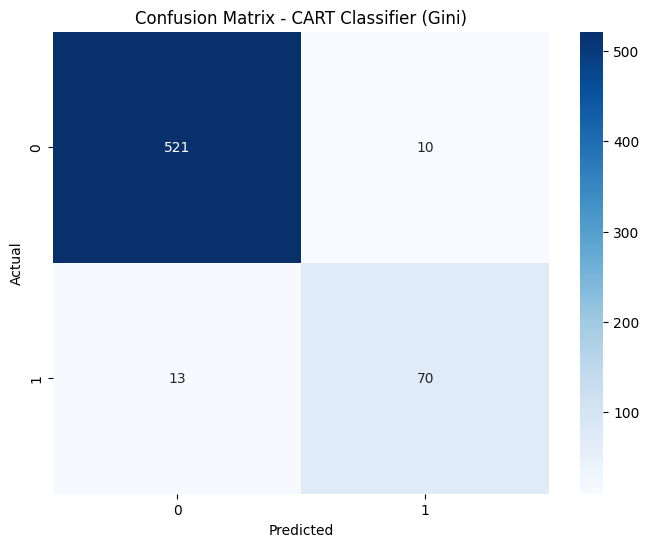

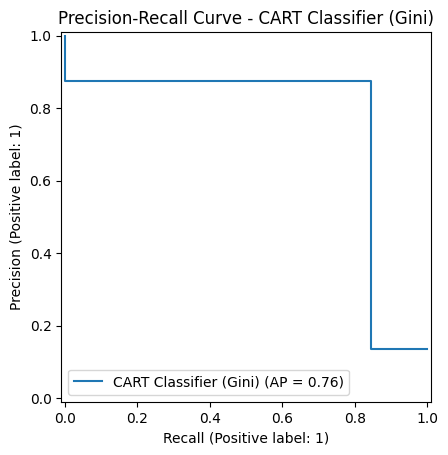

Example Results (Actual vs Predicted) for CART Classifier (Gini): [(0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for ID3 Classifier (Entropy):
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       531
           1       0.86      0.86      0.86        83

    accuracy                           0.96       614
   macro avg       0.92      0.92      0.92       614
weighted avg       0.96      0.96      0.96       614



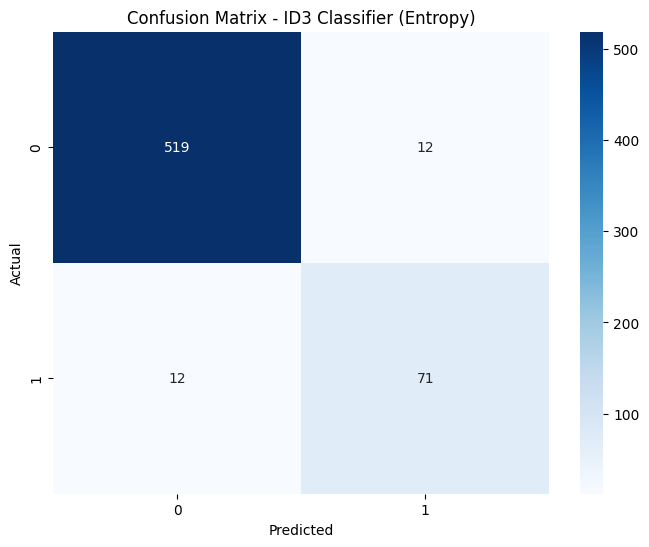

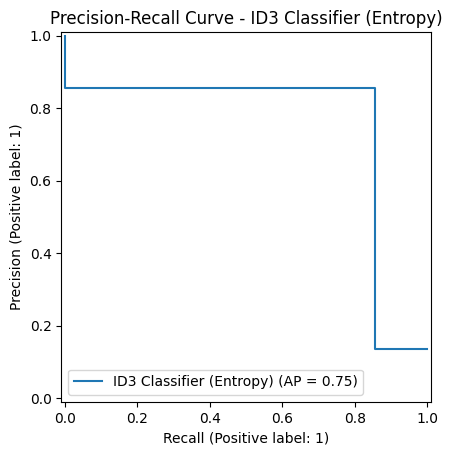

Example Results (Actual vs Predicted) for ID3 Classifier (Entropy): [(0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for C4.5 Classifier Approximation:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       531
           1       0.86      0.86      0.86        83

    accuracy                           0.96       614
   macro avg       0.92      0.92      0.92       614
weighted avg       0.96      0.96      0.96       614



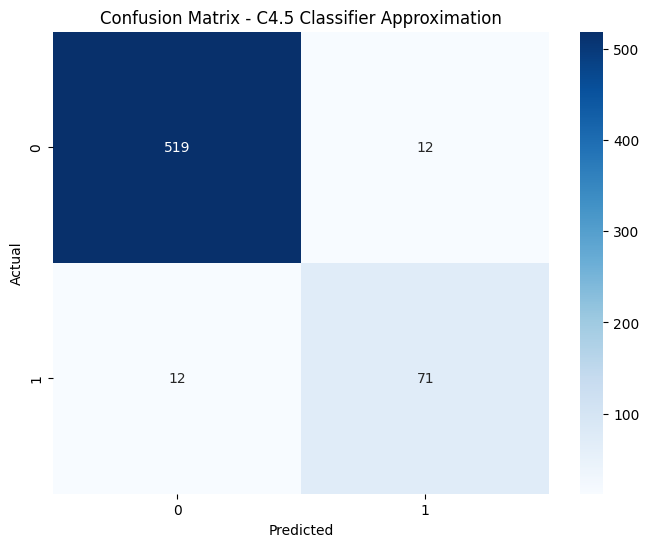

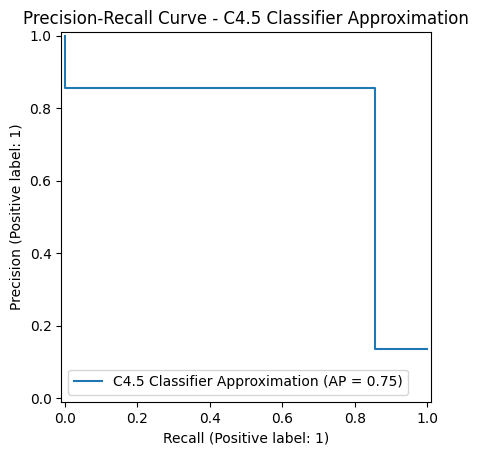

Example Results (Actual vs Predicted) for C4.5 Classifier Approximation: [(0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Extra Tree Classifier:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       531
           1       0.85      0.86      0.85        83

    accuracy                           0.96       614
   macro avg       0.91      0.92      0.91       614
weighted avg       0.96      0.96      0.96       614



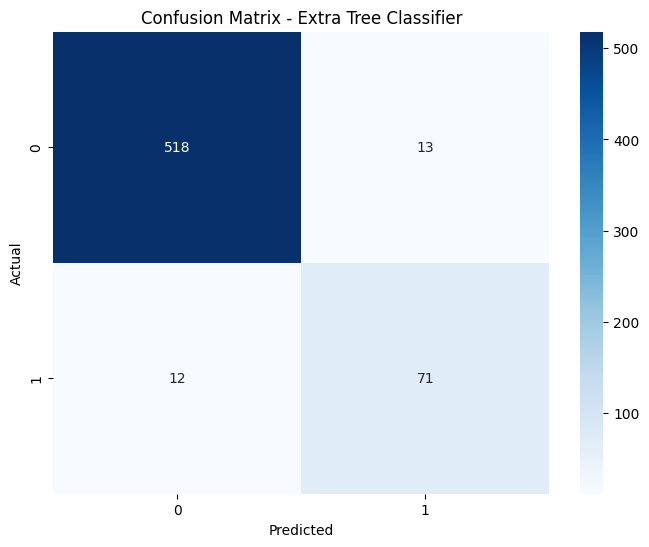

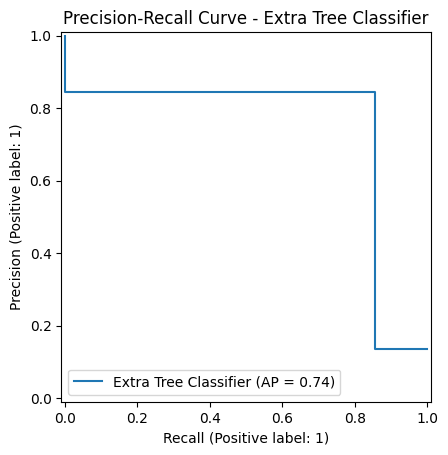

Example Results (Actual vs Predicted) for Extra Tree Classifier: [(0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Random Forest Classifier:
Accuracy: 0.97
Classification Report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.99       531
           1       0.97      0.83      0.90        83

    accuracy                           0.97       614
   macro avg       0.97      0.91      0.94       614
weighted avg       0.97      0.97      0.97       614



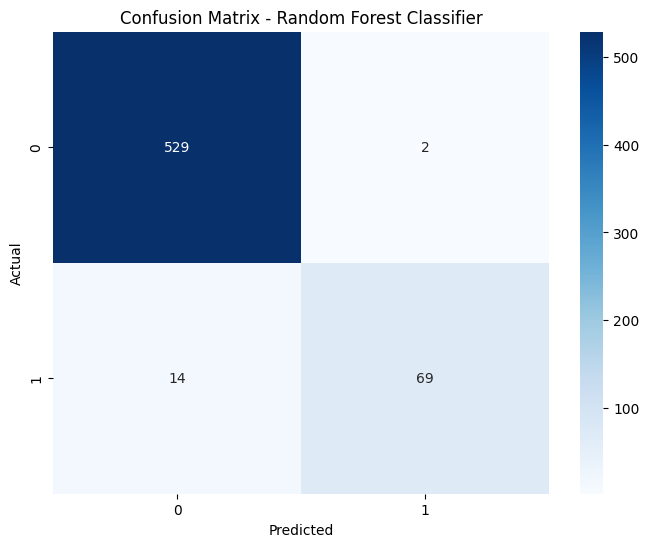

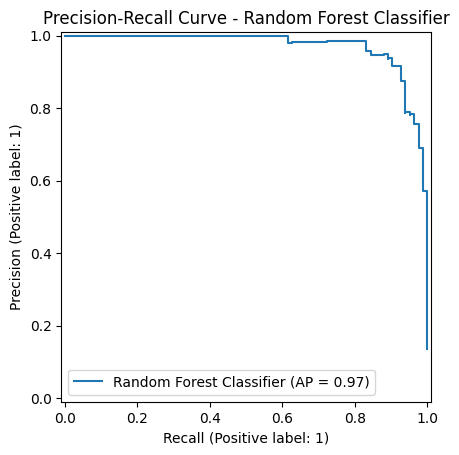

Example Results (Actual vs Predicted) for Random Forest Classifier: [(0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Gradient Boosting Classifier:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       531
           1       0.95      0.76      0.85        83

    accuracy                           0.96       614
   macro avg       0.96      0.88      0.91       614
weighted avg       0.96      0.96      0.96       614



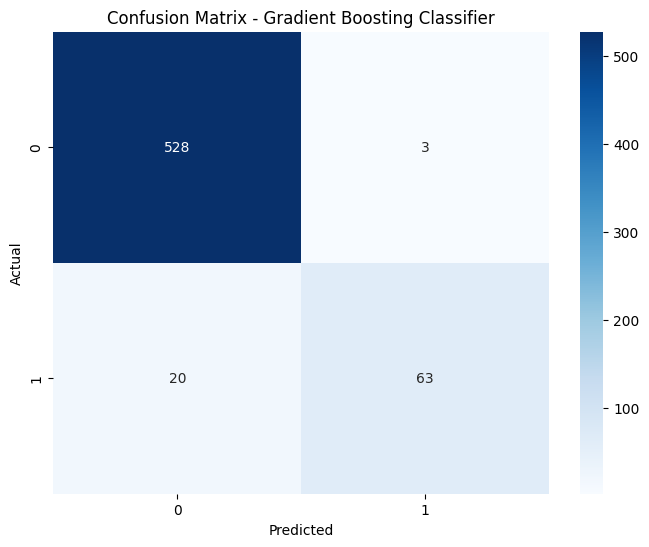

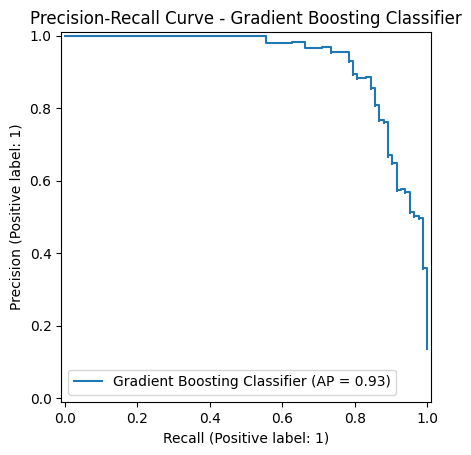

Example Results (Actual vs Predicted) for Gradient Boosting Classifier: [(0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]




c:\Users\Administrator\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Results for AdaBoost Classifier with Decision Tree:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.98      0.97       531
           1       0.86      0.81      0.83        83

    accuracy                           0.96       614
   macro avg       0.91      0.89      0.90       614
weighted avg       0.96      0.96      0.96       614



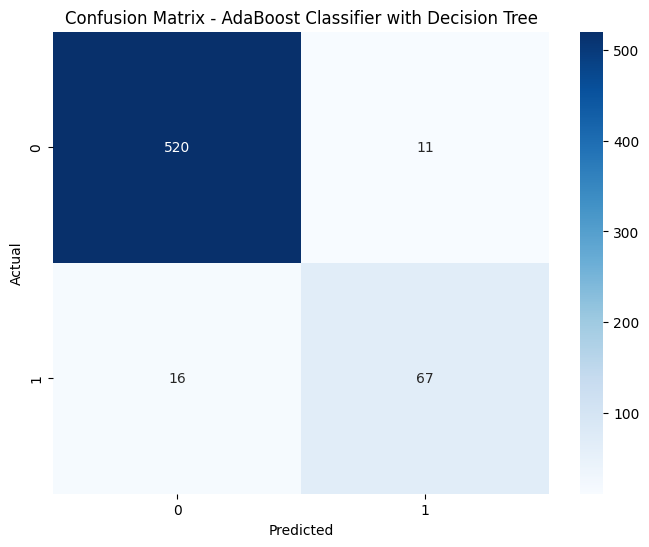

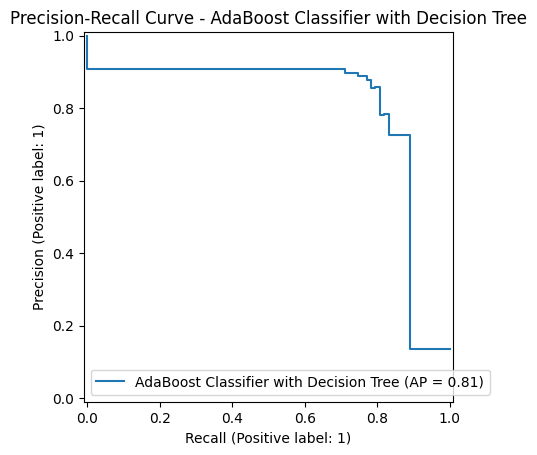

Example Results (Actual vs Predicted) for AdaBoost Classifier with Decision Tree: [(0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for XGBoost Classifier:
Accuracy: 0.98
Classification Report:
               precision    recall  f1-score   support

           0       0.98      1.00      0.99       531
           1       0.97      0.84      0.90        83

    accuracy                           0.98       614
   macro avg       0.97      0.92      0.94       614
weighted avg       0.98      0.98      0.97       614



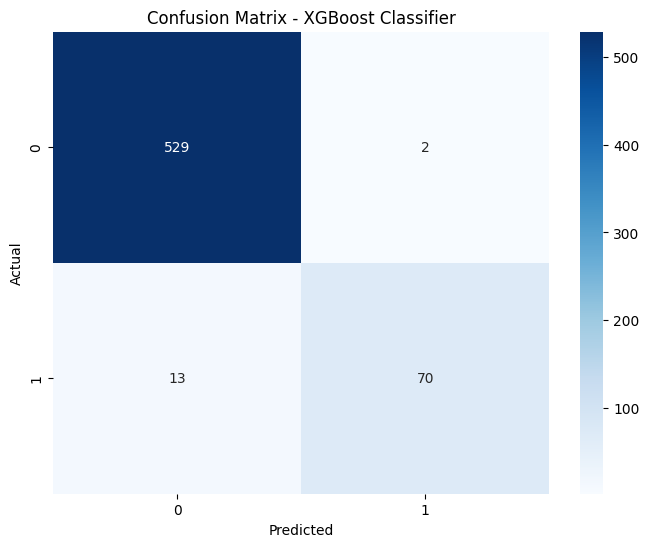

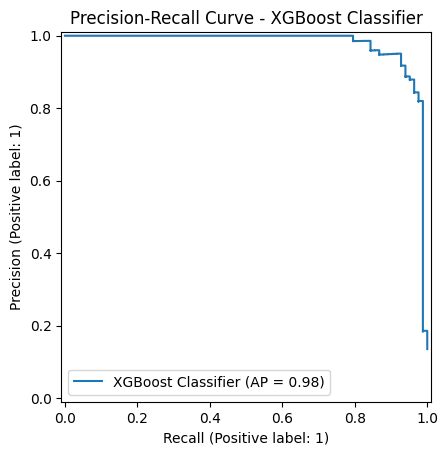

Example Results (Actual vs Predicted) for XGBoost Classifier: [(0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]




In [37]:


# Function to train and evaluate a model
def train_and_evaluate_model(model, model_name):
    # Train the model
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Display Accuracy and Classification Report
    accuracy = accuracy_score(y_test, y_pred)
    class_report = classification_report(y_test, y_pred)
    
    print(f"Results for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print("Classification Report:\n", class_report)
    
    # Plot Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Plot Precision-Recall Curve
    try:
        y_pred_proba = model.predict_proba(X_test)[:, 1]
        display = PrecisionRecallDisplay.from_predictions(y_test, y_pred_proba, name=model_name)
        display.ax_.set_title(f"Precision-Recall Curve - {model_name}")
        plt.show()
    except AttributeError:
        print(f"Warning: {model_name} does not support probability predictions.")
    
    # Example Output
    example = list(zip(y_test[:10], y_pred[:10]))  # Display the first 10 actual vs predicted
    print(f"Example Results (Actual vs Predicted) for {model_name}: {example}")
    
    print("\n" + "="*50 + "\n")

# 1. CART (Classification and Regression Tree) - Gini impurity
cart_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)
train_and_evaluate_model(cart_classifier, "CART Classifier (Gini)")

# 2. ID3 - Approximated using entropy as the criterion
id3_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
train_and_evaluate_model(id3_classifier, "ID3 Classifier (Entropy)")

# 3. C4.5 - Approximated using entropy, similar to ID3
c4_5_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
train_and_evaluate_model(c4_5_classifier, "C4.5 Classifier Approximation")

# 4. Extra Tree Classifier (another variant of decision trees)
extra_tree_classifier = ExtraTreeClassifier(random_state=42)
train_and_evaluate_model(extra_tree_classifier, "Extra Tree Classifier")

# 5. Random Forest Classifier
random_forest_classifier = RandomForestClassifier(random_state=42)
train_and_evaluate_model(random_forest_classifier, "Random Forest Classifier")

# 6. Gradient Boosting Classifier
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)
train_and_evaluate_model(gradient_boosting_classifier, "Gradient Boosting Classifier")

# 7. AdaBoost Classifier (with a Decision Tree as the base estimator)
adaboost_classifier = AdaBoostClassifier(estimator=DecisionTreeClassifier(), random_state=42)
train_and_evaluate_model(adaboost_classifier, "AdaBoost Classifier with Decision Tree")

# 8. XGBoost Classifier
xgb_classifier = xgb.XGBClassifier(random_state=42)
train_and_evaluate_model(xgb_classifier, "XGBoost Classifier")


Droping the Outlier Records with both 1 and 0 for Churn Value

In [82]:
dataset = pd.read_csv('Customer_Churn.csv')
dataset = dataset.drop(index=zero_indices_ch1)
dataset = dataset.drop(index=zero_indices_ch0)

Creating the Set of Training and Test Set without Outliers with both 1 and 0 for Churn Value

In [83]:
# Define feature columns (X) and target column (y)
X = dataset.iloc[:, :-1].values  
y = dataset.iloc[:, -1].values

# Split the dataset into training and testing sets
def custom_train_test_split(X, y, test_size=0.2, stratify=None, random_state=None):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=stratify, random_state=random_state)
    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = custom_train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Function to print class proportions
def print_proportions(y):
    unique, counts = np.unique(y, return_counts=True)
    total = len(y)
    for val, count in zip(unique, counts):
        print(f"Class {val}: {count} ({count/total*100:.1f}%)")

print("\nTraining set proportions:")
print_proportions(y_train)
print("\nTest set proportions:")
print_proportions(y_test)


Training set proportions:
Class 0: 2065 (86.2%)
Class 1: 331 (13.8%)

Test set proportions:
Class 0: 517 (86.2%)
Class 1: 83 (13.8%)


Running Desicion Trees on Dataset without Outliers with both 1 and 0 for Churn Value

Results for CART Classifier (Gini):
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.98      0.98       517
           1       0.88      0.82      0.85        83

    accuracy                           0.96       600
   macro avg       0.93      0.90      0.91       600
weighted avg       0.96      0.96      0.96       600



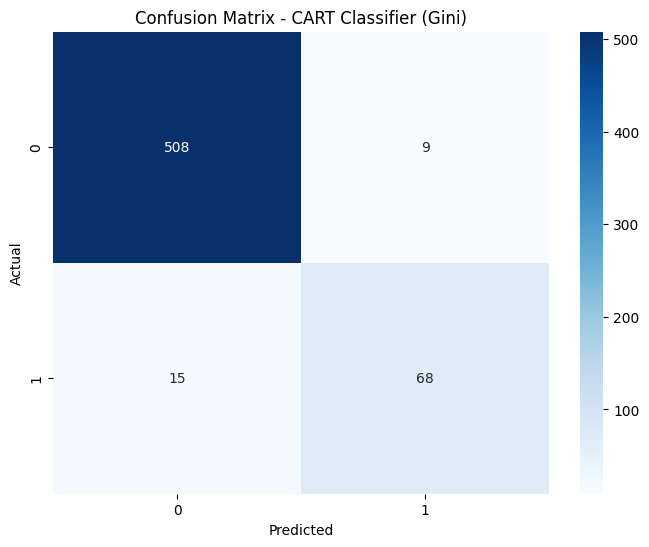

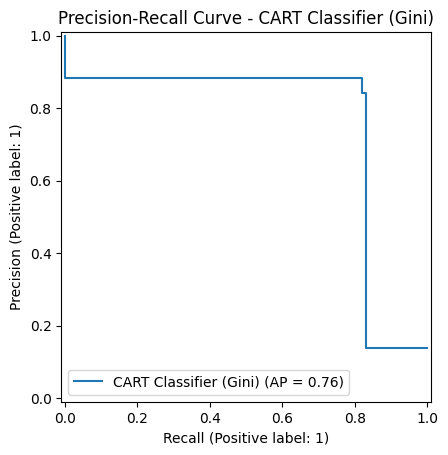

Example Results (Actual vs Predicted) for CART Classifier (Gini): [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for ID3 Classifier (Entropy):
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       517
           1       0.88      0.87      0.87        83

    accuracy                           0.96       600
   macro avg       0.93      0.92      0.93       600
weighted avg       0.96      0.96      0.96       600



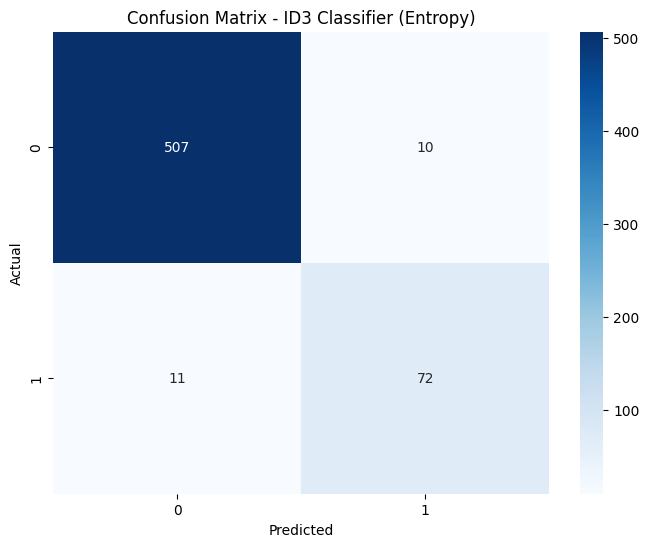

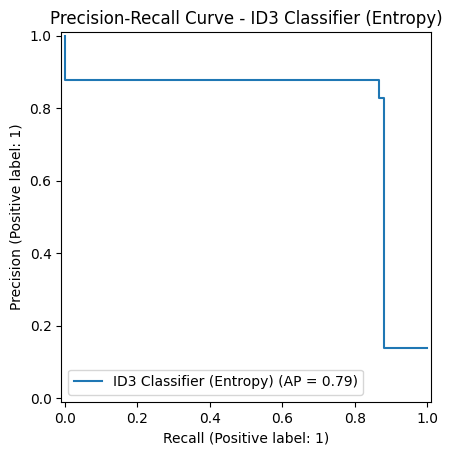

Example Results (Actual vs Predicted) for ID3 Classifier (Entropy): [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for C4.5 Classifier Approximation:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       517
           1       0.88      0.87      0.87        83

    accuracy                           0.96       600
   macro avg       0.93      0.92      0.93       600
weighted avg       0.96      0.96      0.96       600



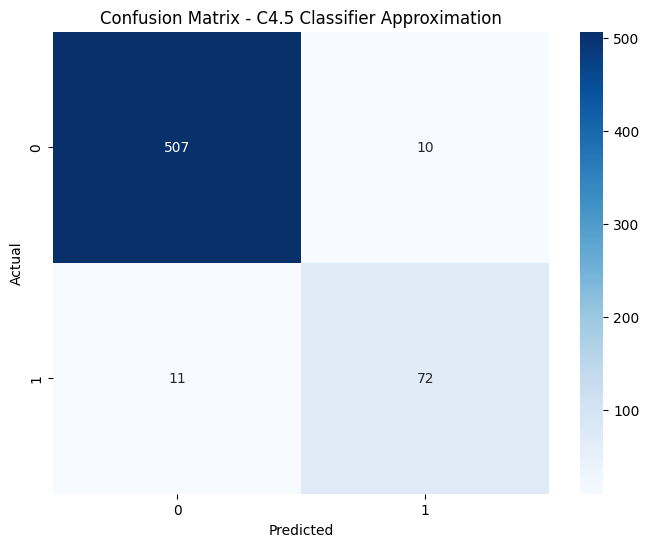

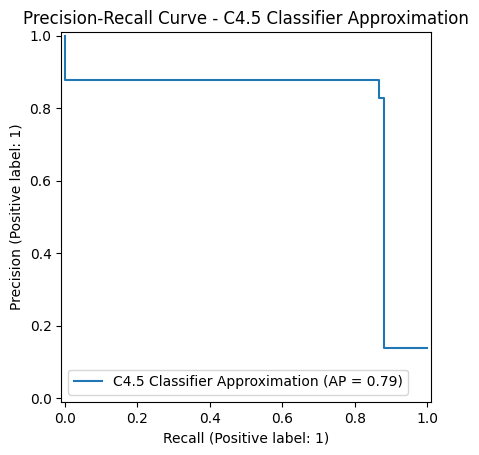

Example Results (Actual vs Predicted) for C4.5 Classifier Approximation: [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Extra Tree Classifier:
Accuracy: 0.94
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.97      0.97       517
           1       0.81      0.75      0.78        83

    accuracy                           0.94       600
   macro avg       0.88      0.86      0.87       600
weighted avg       0.94      0.94      0.94       600



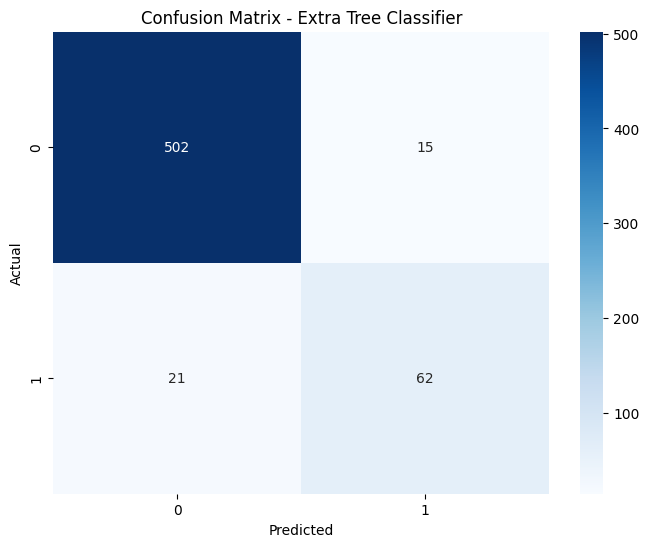

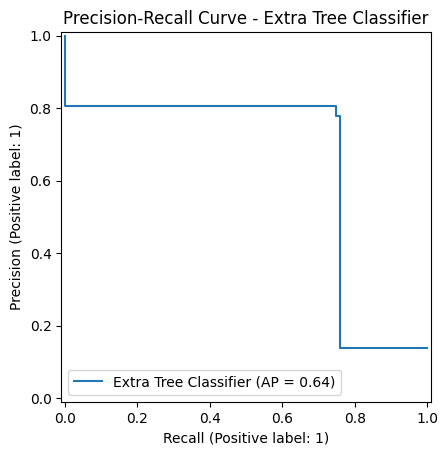

Example Results (Actual vs Predicted) for Extra Tree Classifier: [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Random Forest Classifier:
Accuracy: 0.97
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       517
           1       0.96      0.82      0.88        83

    accuracy                           0.97       600
   macro avg       0.96      0.91      0.93       600
weighted avg       0.97      0.97      0.97       600



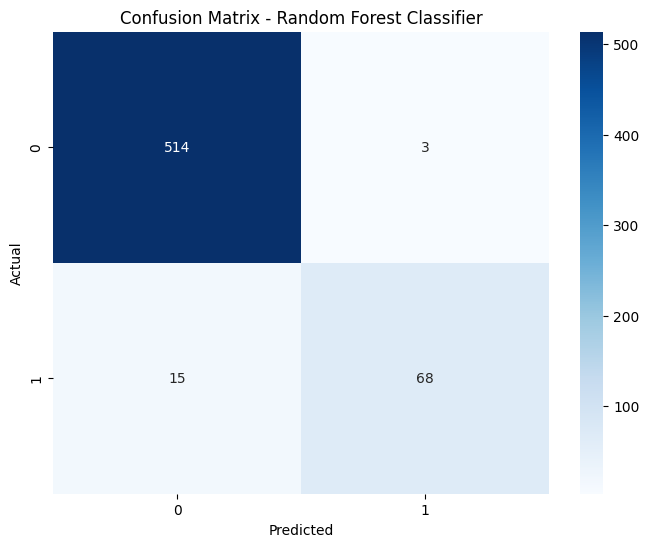

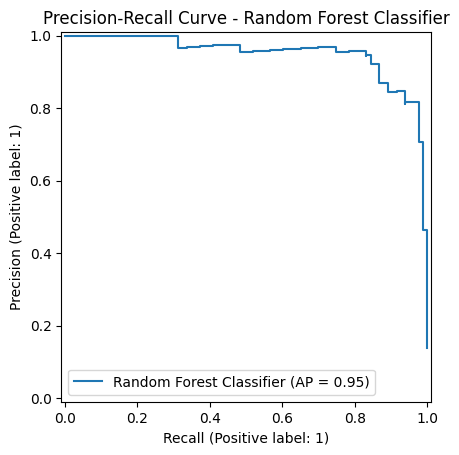

Example Results (Actual vs Predicted) for Random Forest Classifier: [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Gradient Boosting Classifier:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       517
           1       0.93      0.75      0.83        83

    accuracy                           0.96       600
   macro avg       0.94      0.87      0.90       600
weighted avg       0.96      0.96      0.95       600



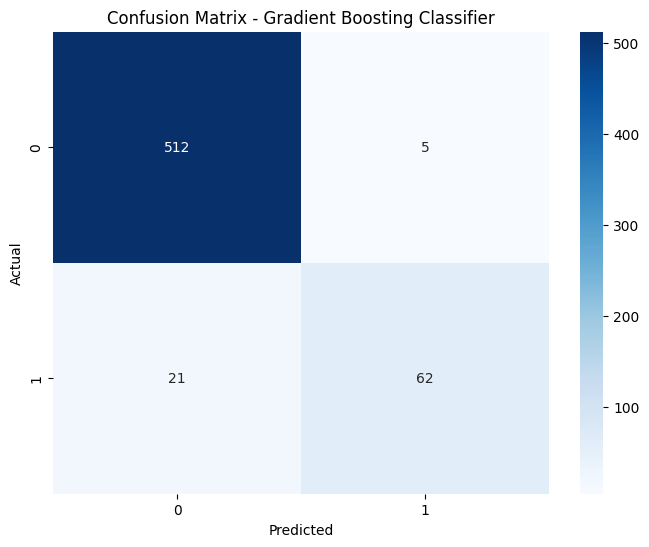

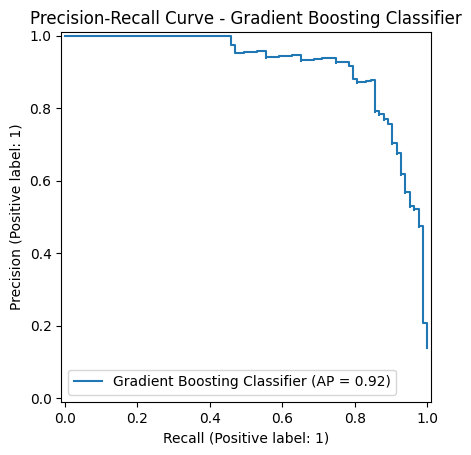

Example Results (Actual vs Predicted) for Gradient Boosting Classifier: [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]




c:\Users\Administrator\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Results for AdaBoost Classifier with Decision Tree:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.98      0.98       517
           1       0.85      0.84      0.85        83

    accuracy                           0.96       600
   macro avg       0.91      0.91      0.91       600
weighted avg       0.96      0.96      0.96       600



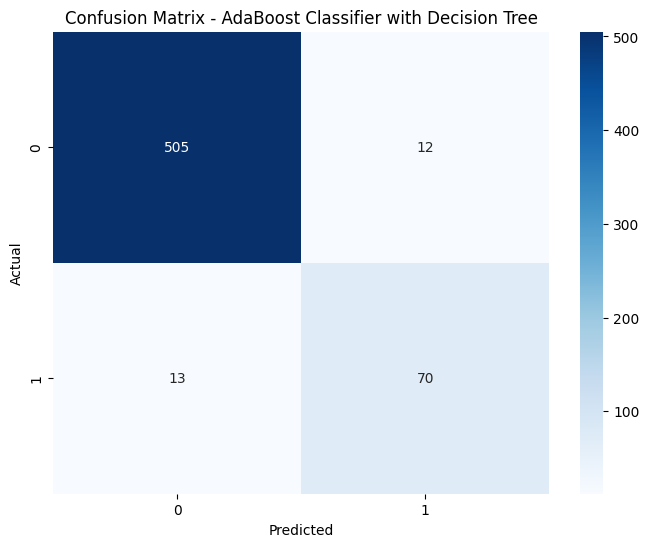

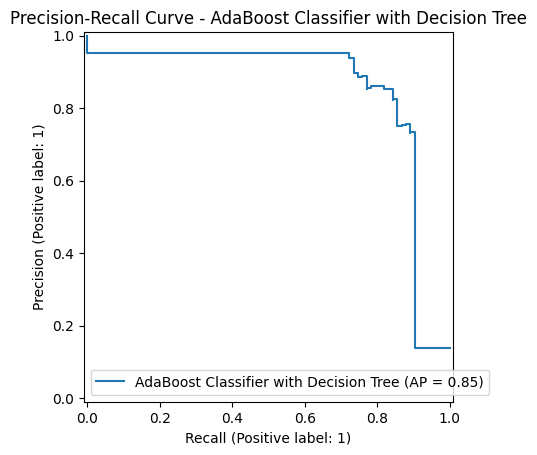

Example Results (Actual vs Predicted) for AdaBoost Classifier with Decision Tree: [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for XGBoost Classifier:
Accuracy: 0.97
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98       517
           1       0.95      0.84      0.89        83

    accuracy                           0.97       600
   macro avg       0.96      0.92      0.94       600
weighted avg       0.97      0.97      0.97       600



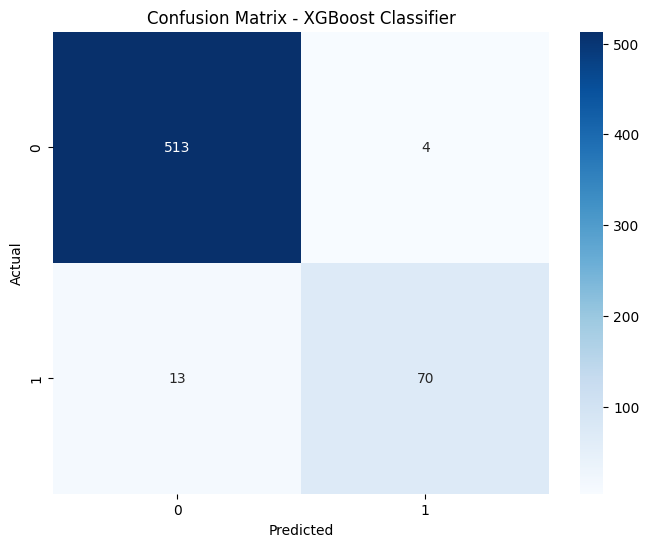

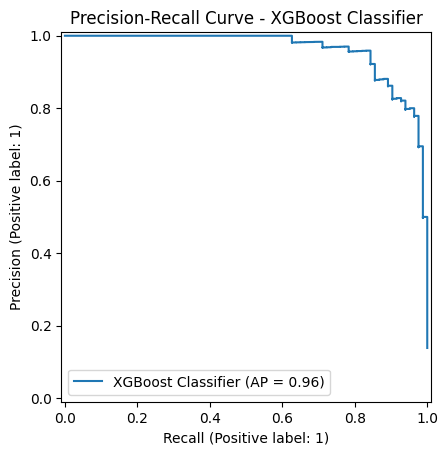

Example Results (Actual vs Predicted) for XGBoost Classifier: [(0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]




In [84]:


# Function to train and evaluate a model
def train_and_evaluate_model(model, model_name):
    # Train the model
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Display Accuracy and Classification Report
    accuracy = accuracy_score(y_test, y_pred)
    class_report = classification_report(y_test, y_pred)
    
    print(f"Results for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print("Classification Report:\n", class_report)
    
    # Plot Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Plot Precision-Recall Curve
    try:
        y_pred_proba = model.predict_proba(X_test)[:, 1]
        display = PrecisionRecallDisplay.from_predictions(y_test, y_pred_proba, name=model_name)
        display.ax_.set_title(f"Precision-Recall Curve - {model_name}")
        plt.show()
    except AttributeError:
        print(f"Warning: {model_name} does not support probability predictions.")
    
    # Example Output
    example = list(zip(y_test[:10], y_pred[:10]))  # Display the first 10 actual vs predicted
    print(f"Example Results (Actual vs Predicted) for {model_name}: {example}")
    
    print("\n" + "="*50 + "\n")

# 1. CART (Classification and Regression Tree) - Gini impurity
cart_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)
train_and_evaluate_model(cart_classifier, "CART Classifier (Gini)")

# 2. ID3 - Approximated using entropy as the criterion
id3_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
train_and_evaluate_model(id3_classifier, "ID3 Classifier (Entropy)")

# 3. C4.5 - Approximated using entropy, similar to ID3
c4_5_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
train_and_evaluate_model(c4_5_classifier, "C4.5 Classifier Approximation")

# 4. Extra Tree Classifier (another variant of decision trees)
extra_tree_classifier = ExtraTreeClassifier(random_state=42)
train_and_evaluate_model(extra_tree_classifier, "Extra Tree Classifier")

# 5. Random Forest Classifier
random_forest_classifier = RandomForestClassifier(random_state=42)
train_and_evaluate_model(random_forest_classifier, "Random Forest Classifier")

# 6. Gradient Boosting Classifier
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)
train_and_evaluate_model(gradient_boosting_classifier, "Gradient Boosting Classifier")

# 7. AdaBoost Classifier (with a Decision Tree as the base estimator)
adaboost_classifier = AdaBoostClassifier(estimator=DecisionTreeClassifier(), random_state=42)
train_and_evaluate_model(adaboost_classifier, "AdaBoost Classifier with Decision Tree")

# 8. XGBoost Classifier
xgb_classifier = xgb.XGBClassifier(random_state=42)
train_and_evaluate_model(xgb_classifier, "XGBoost Classifier")


Droping the Outlier Records with 0 for Churn Value

In [114]:
dataset = pd.read_csv('Customer_Churn.csv')
dataset = dataset.drop(index=zero_indices_ch0)

Creating the Set of Training and Test Set without Outliers with 0 for Churn Value

In [116]:
# Define feature columns (X) and target column (y)
X = dataset.iloc[:, :-1].values  
y = dataset.iloc[:, -1].values

# Split the dataset into training and testing sets
def custom_train_test_split(X, y, test_size=0.2, stratify=None, random_state=None):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=stratify, random_state=random_state)
    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = custom_train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Function to print class proportions
def print_proportions(y):
    unique, counts = np.unique(y, return_counts=True)
    total = len(y)
    for val, count in zip(unique, counts):
        print(f"Class {val}: {count} ({count/total*100:.1f}%)")

print("\nTraining set proportions:")
print_proportions(y_train)
print("\nTest set proportions:")
print_proportions(y_test)


Training set proportions:
Class 0: 2065 (83.9%)
Class 1: 396 (16.1%)

Test set proportions:
Class 0: 517 (83.9%)
Class 1: 99 (16.1%)


Running Desicion Trees on Dataset without Outliers with 0 for Churn Value

Results for CART Classifier (Gini):
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97       517
           1       0.87      0.87      0.87        99

    accuracy                           0.96       616
   macro avg       0.92      0.92      0.92       616
weighted avg       0.96      0.96      0.96       616



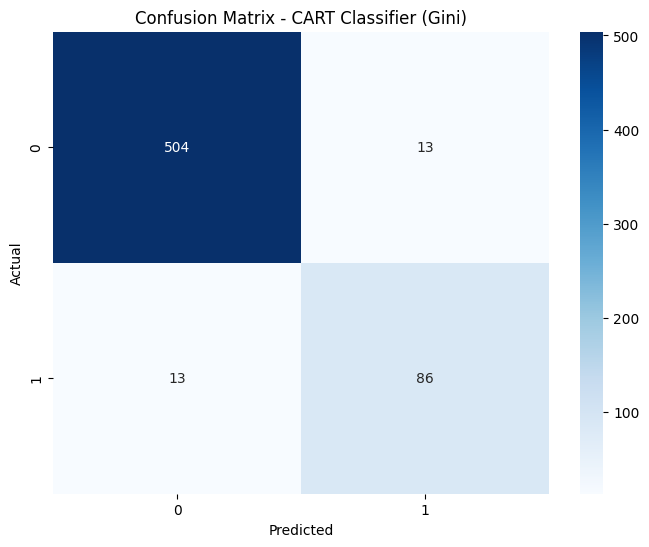

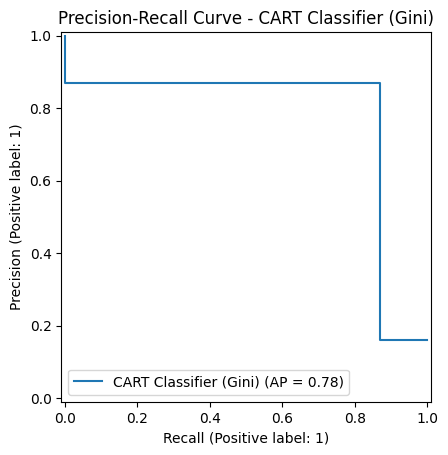

Example Results (Actual vs Predicted) for CART Classifier (Gini): [(0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for ID3 Classifier (Entropy):
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       517
           1       0.91      0.87      0.89        99

    accuracy                           0.96       616
   macro avg       0.94      0.93      0.93       616
weighted avg       0.96      0.96      0.96       616



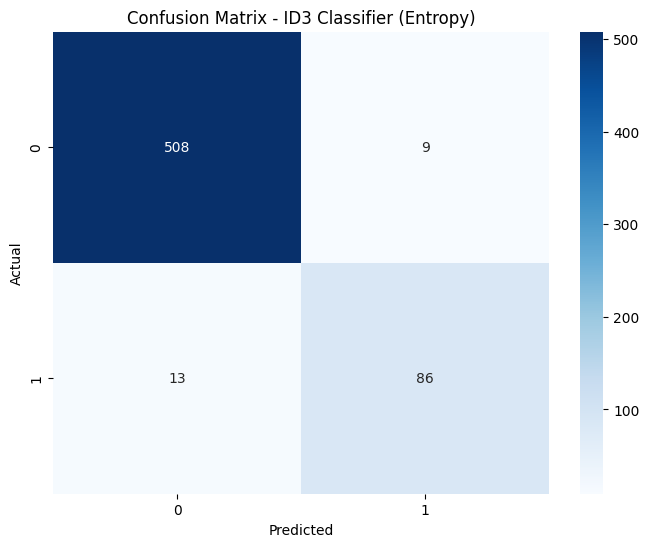

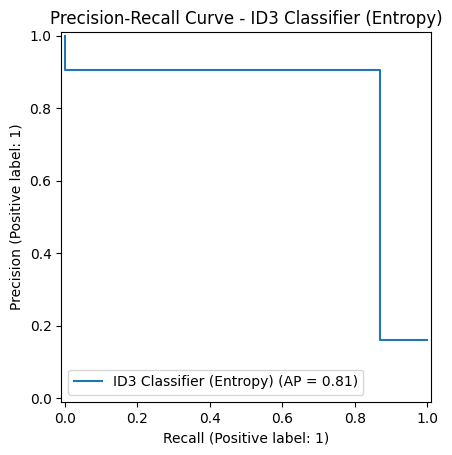

Example Results (Actual vs Predicted) for ID3 Classifier (Entropy): [(0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for C4.5 Classifier Approximation:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       517
           1       0.91      0.87      0.89        99

    accuracy                           0.96       616
   macro avg       0.94      0.93      0.93       616
weighted avg       0.96      0.96      0.96       616



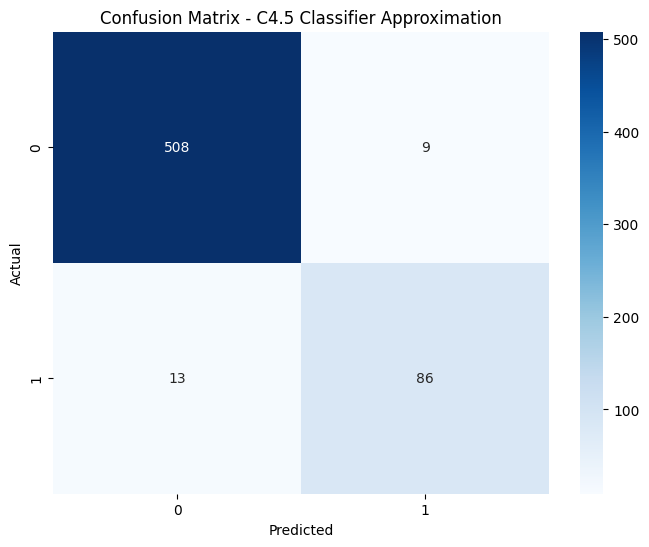

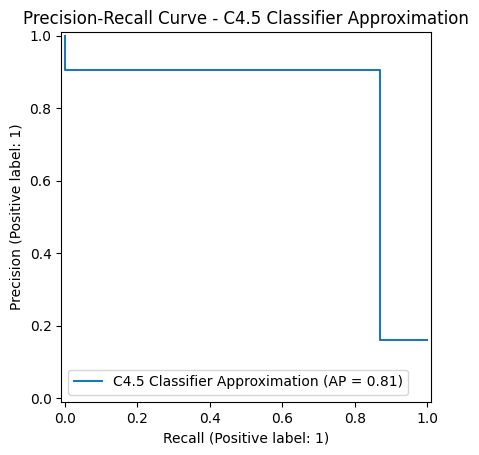

Example Results (Actual vs Predicted) for C4.5 Classifier Approximation: [(0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Extra Tree Classifier:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.98      0.98       517
           1       0.88      0.87      0.87        99

    accuracy                           0.96       616
   macro avg       0.93      0.92      0.92       616
weighted avg       0.96      0.96      0.96       616



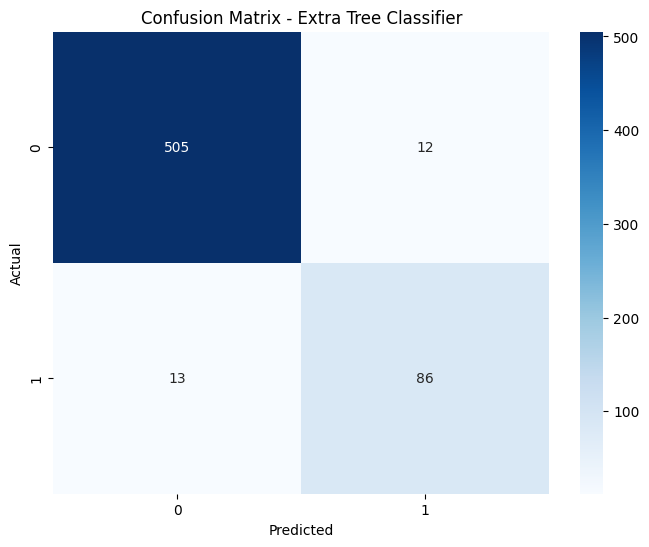

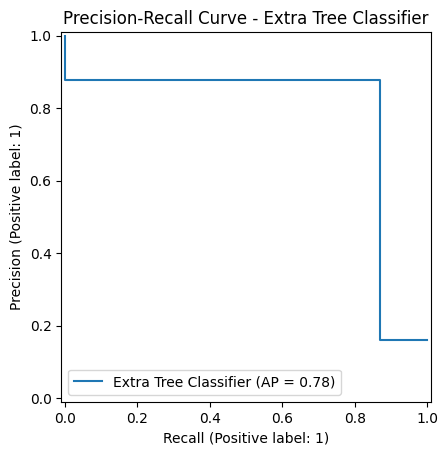

Example Results (Actual vs Predicted) for Extra Tree Classifier: [(0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Random Forest Classifier:
Accuracy: 0.98
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99       517
           1       0.97      0.89      0.93        99

    accuracy                           0.98       616
   macro avg       0.97      0.94      0.96       616
weighted avg       0.98      0.98      0.98       616



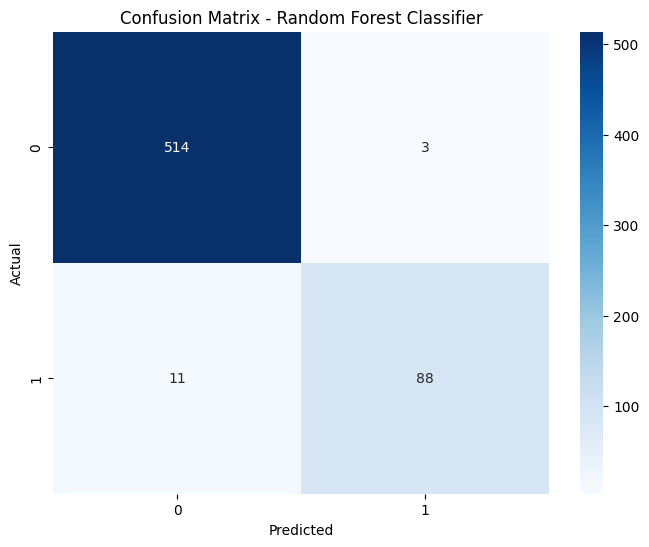

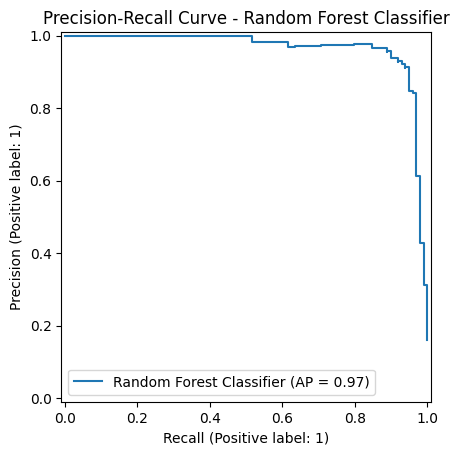

Example Results (Actual vs Predicted) for Random Forest Classifier: [(0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for Gradient Boosting Classifier:
Accuracy: 0.96
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       517
           1       0.96      0.80      0.87        99

    accuracy                           0.96       616
   macro avg       0.96      0.90      0.93       616
weighted avg       0.96      0.96      0.96       616



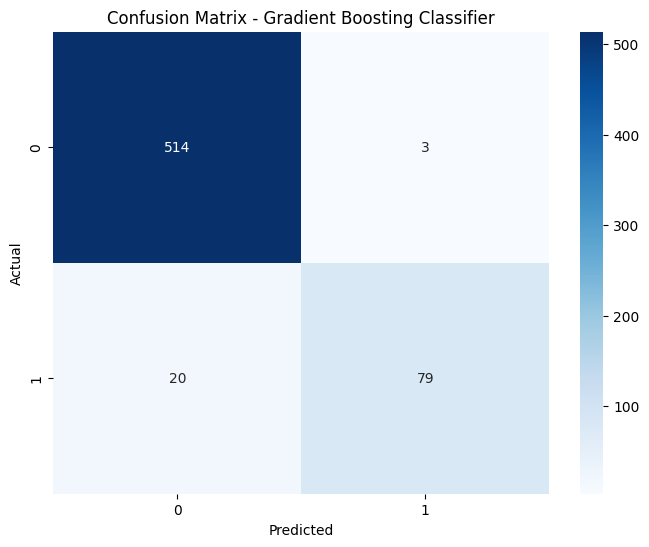

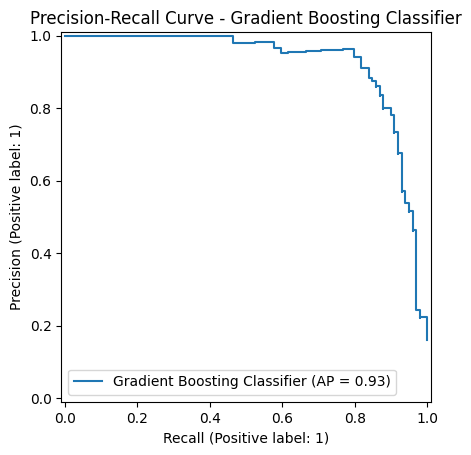

Example Results (Actual vs Predicted) for Gradient Boosting Classifier: [(0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]




c:\Users\Administrator\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Results for AdaBoost Classifier with Decision Tree:
Accuracy: 0.95
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97       517
           1       0.83      0.84      0.83        99

    accuracy                           0.95       616
   macro avg       0.90      0.90      0.90       616
weighted avg       0.95      0.95      0.95       616



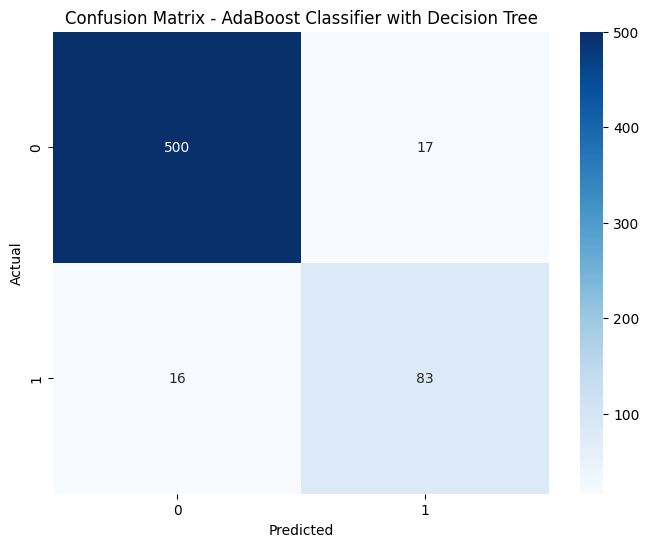

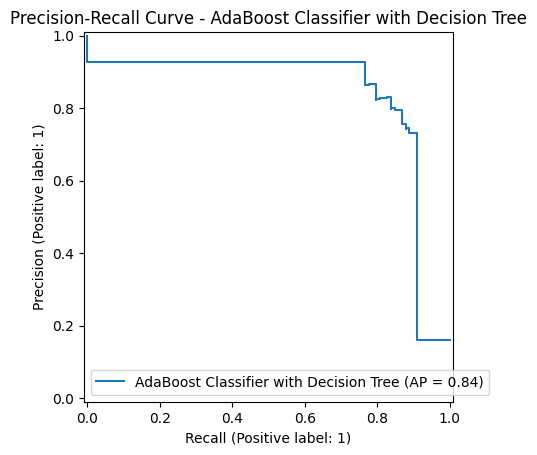

Example Results (Actual vs Predicted) for AdaBoost Classifier with Decision Tree: [(0, 0), (0, 0), (1, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]


Results for XGBoost Classifier:
Accuracy: 0.97
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98       517
           1       0.94      0.90      0.92        99

    accuracy                           0.97       616
   macro avg       0.96      0.94      0.95       616
weighted avg       0.97      0.97      0.97       616



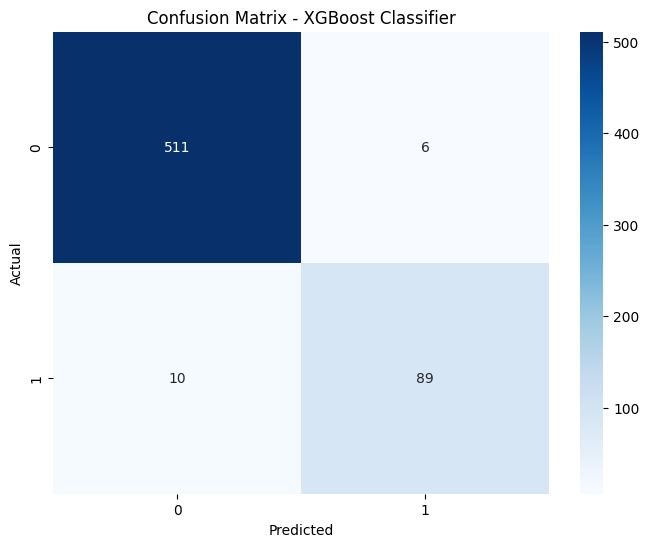

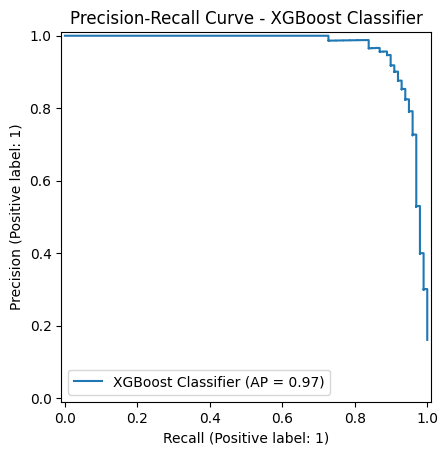

Example Results (Actual vs Predicted) for XGBoost Classifier: [(0, 0), (0, 0), (1, 1), (0, 0), (0, 1), (0, 0), (0, 0), (0, 0), (0, 0), (0, 0)]




In [117]:


# Function to train and evaluate a model
def train_and_evaluate_model(model, model_name):
    # Train the model
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Display Accuracy and Classification Report
    accuracy = accuracy_score(y_test, y_pred)
    class_report = classification_report(y_test, y_pred)
    
    print(f"Results for {model_name}:")
    print(f"Accuracy: {accuracy:.2f}")
    print("Classification Report:\n", class_report)
    
    # Plot Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Plot Precision-Recall Curve
    try:
        y_pred_proba = model.predict_proba(X_test)[:, 1]
        display = PrecisionRecallDisplay.from_predictions(y_test, y_pred_proba, name=model_name)
        display.ax_.set_title(f"Precision-Recall Curve - {model_name}")
        plt.show()
    except AttributeError:
        print(f"Warning: {model_name} does not support probability predictions.")
    
    # Example Output
    example = list(zip(y_test[:10], y_pred[:10]))  # Display the first 10 actual vs predicted
    print(f"Example Results (Actual vs Predicted) for {model_name}: {example}")
    
    print("\n" + "="*50 + "\n")

# 1. CART (Classification and Regression Tree) - Gini impurity
cart_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)
train_and_evaluate_model(cart_classifier, "CART Classifier (Gini)")

# 2. ID3 - Approximated using entropy as the criterion
id3_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
train_and_evaluate_model(id3_classifier, "ID3 Classifier (Entropy)")

# 3. C4.5 - Approximated using entropy, similar to ID3
c4_5_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
train_and_evaluate_model(c4_5_classifier, "C4.5 Classifier Approximation")

# 4. Extra Tree Classifier (another variant of decision trees)
extra_tree_classifier = ExtraTreeClassifier(random_state=42)
train_and_evaluate_model(extra_tree_classifier, "Extra Tree Classifier")

# 5. Random Forest Classifier
random_forest_classifier = RandomForestClassifier(random_state=42)
train_and_evaluate_model(random_forest_classifier, "Random Forest Classifier")

# 6. Gradient Boosting Classifier
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)
train_and_evaluate_model(gradient_boosting_classifier, "Gradient Boosting Classifier")

# 7. AdaBoost Classifier (with a Decision Tree as the base estimator)
adaboost_classifier = AdaBoostClassifier(estimator=DecisionTreeClassifier(), random_state=42)
train_and_evaluate_model(adaboost_classifier, "AdaBoost Classifier with Decision Tree")

# 8. XGBoost Classifier
xgb_classifier = xgb.XGBClassifier(random_state=42)
train_and_evaluate_model(xgb_classifier, "XGBoost Classifier")


Optimizing the Models by Implementing Hyperparameters

Results for CART Classifier (Gini):
Accuracy: 0.9577922077922078
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97       517
           1       0.87      0.87      0.87        99

    accuracy                           0.96       616
   macro avg       0.92      0.92      0.92       616
weighted avg       0.96      0.96      0.96       616



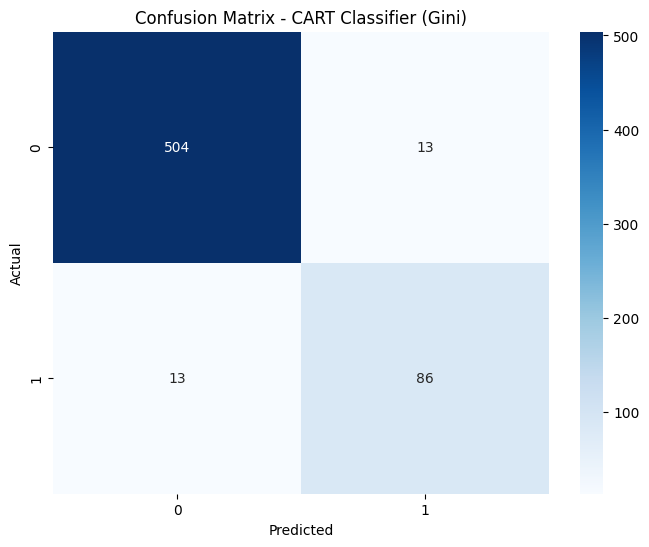

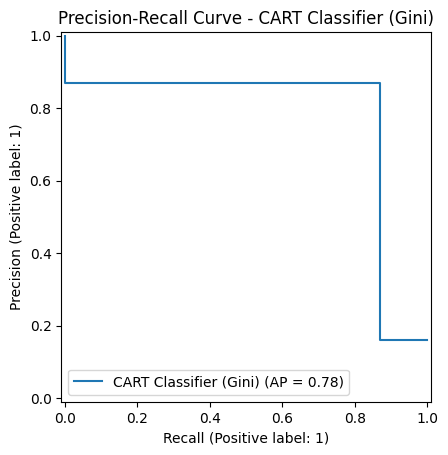



Results for ID3 Classifier (Entropy):
Accuracy: 0.9642857142857143
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       517
           1       0.91      0.87      0.89        99

    accuracy                           0.96       616
   macro avg       0.94      0.93      0.93       616
weighted avg       0.96      0.96      0.96       616



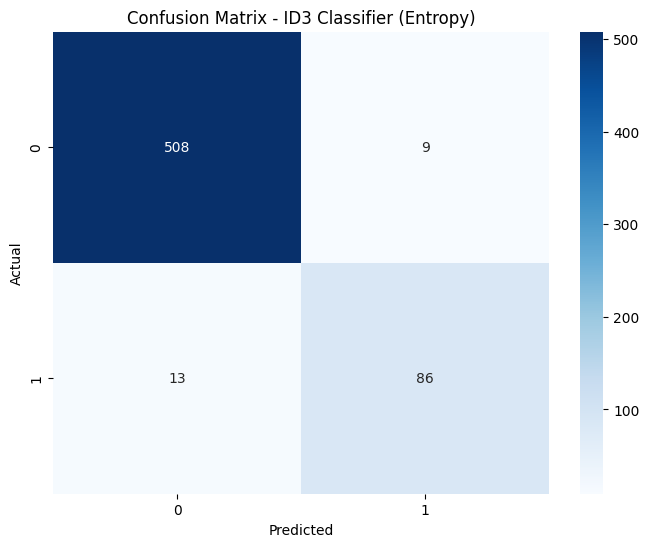

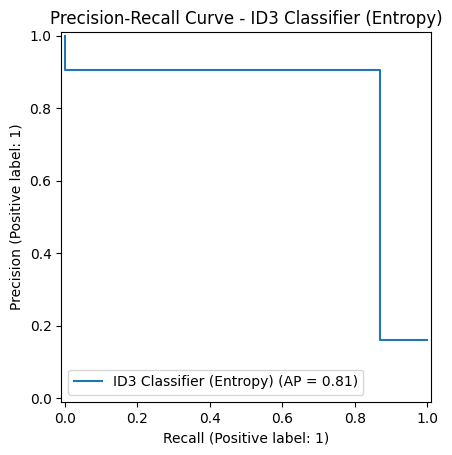



Results for C4.5 Classifier Approximation:
Accuracy: 0.9642857142857143
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       517
           1       0.91      0.87      0.89        99

    accuracy                           0.96       616
   macro avg       0.94      0.93      0.93       616
weighted avg       0.96      0.96      0.96       616



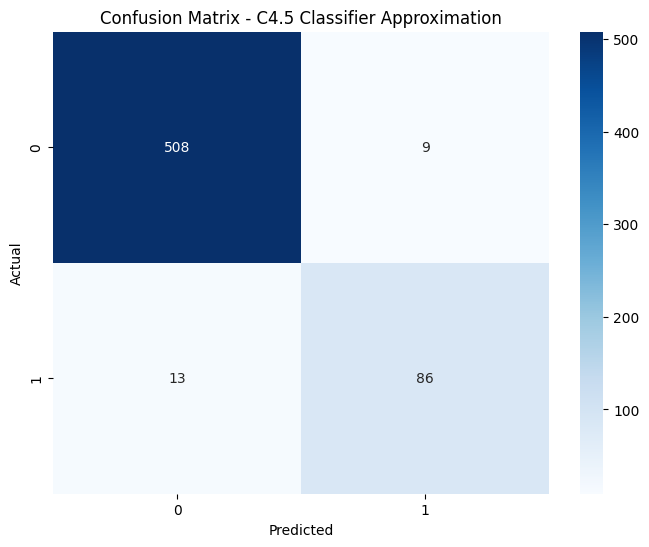

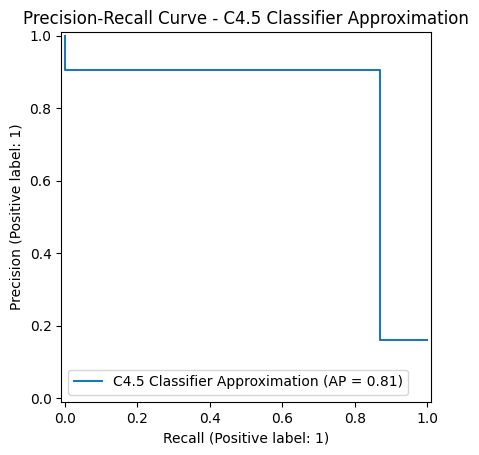



Results for Extra Tree Classifier:
Accuracy: 0.9594155844155844
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.98      0.98       517
           1       0.88      0.87      0.87        99

    accuracy                           0.96       616
   macro avg       0.93      0.92      0.92       616
weighted avg       0.96      0.96      0.96       616



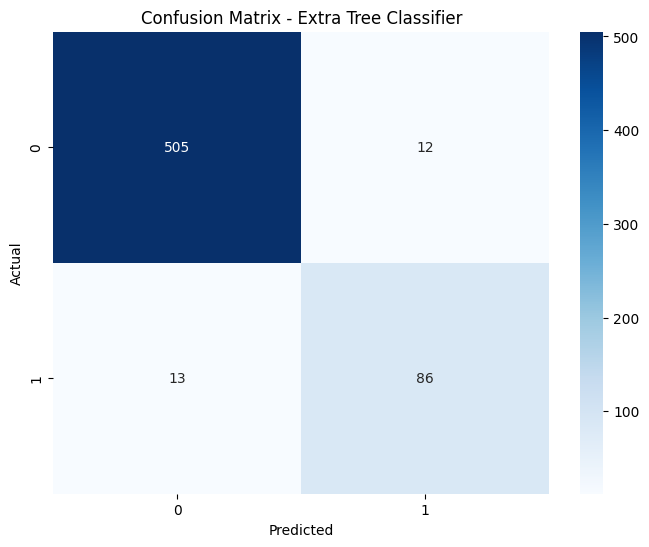

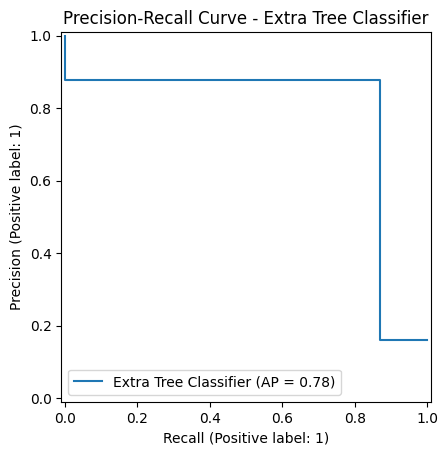



Results for Random Forest Classifier:
Accuracy: 0.9772727272727273
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99       517
           1       0.97      0.89      0.93        99

    accuracy                           0.98       616
   macro avg       0.97      0.94      0.96       616
weighted avg       0.98      0.98      0.98       616



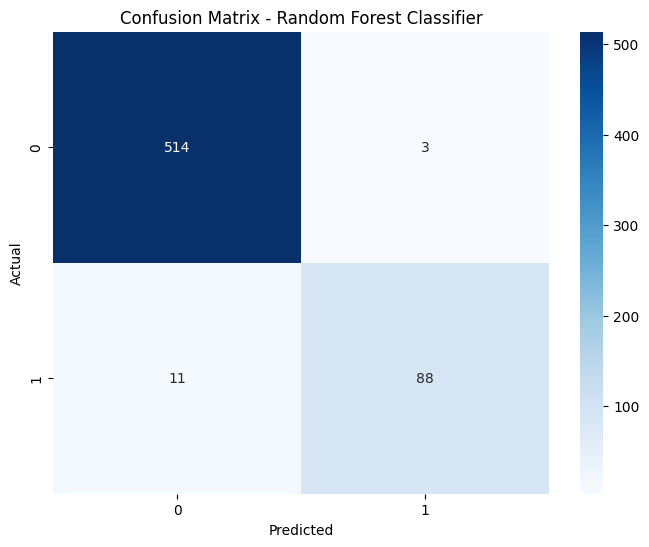

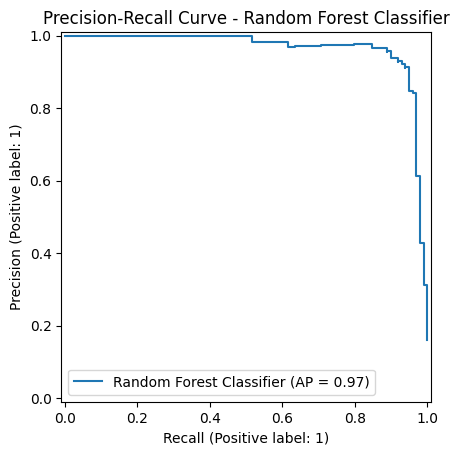



Results for Gradient Boosting Classifier:
Accuracy: 0.9626623376623377
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.99      0.98       517
           1       0.96      0.80      0.87        99

    accuracy                           0.96       616
   macro avg       0.96      0.90      0.93       616
weighted avg       0.96      0.96      0.96       616



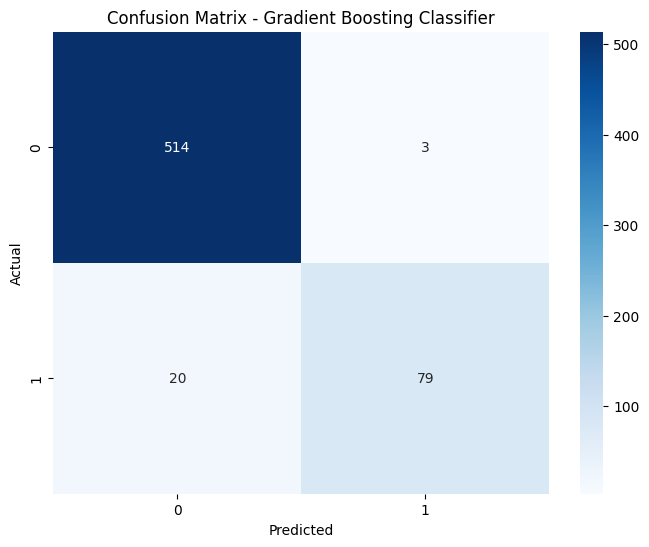

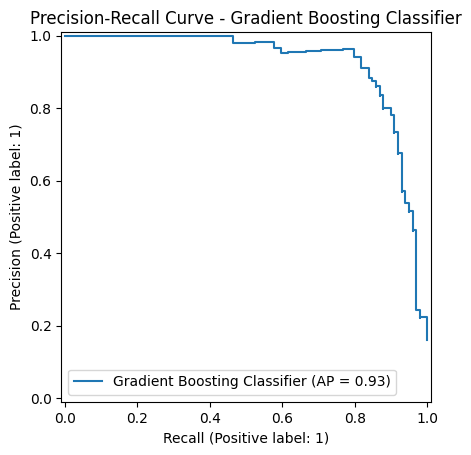

c:\Users\Administrator\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Results for AdaBoost Classifier with Decision Tree:
Accuracy: 0.9464285714285714
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97       517
           1       0.83      0.84      0.83        99

    accuracy                           0.95       616
   macro avg       0.90      0.90      0.90       616
weighted avg       0.95      0.95      0.95       616



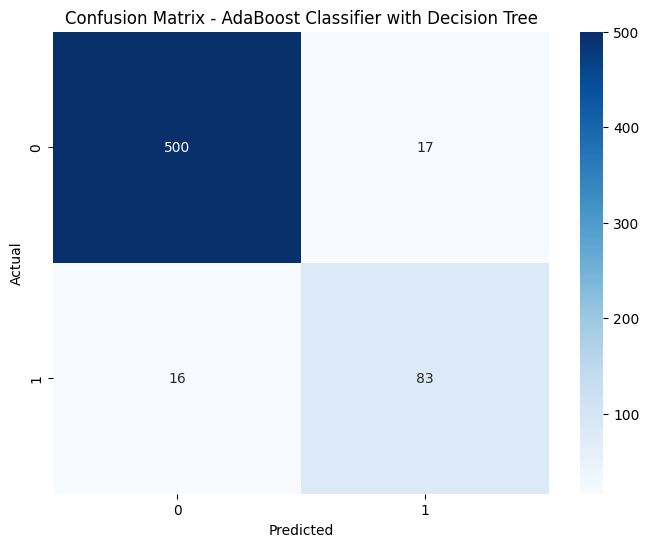

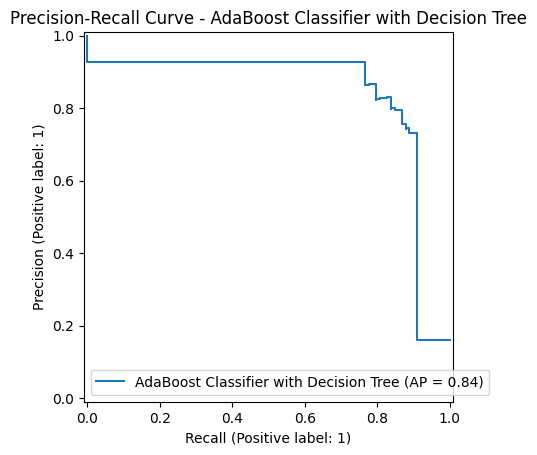



Results for XGBoost Classifier:
Accuracy: 0.974025974025974
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98       517
           1       0.94      0.90      0.92        99

    accuracy                           0.97       616
   macro avg       0.96      0.94      0.95       616
weighted avg       0.97      0.97      0.97       616



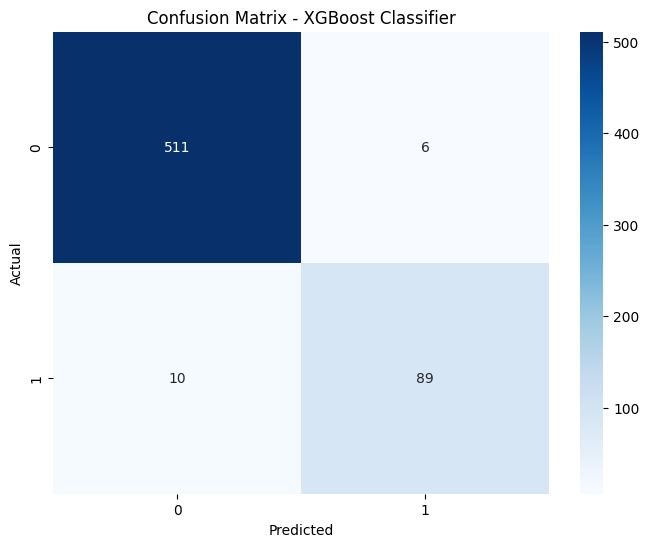

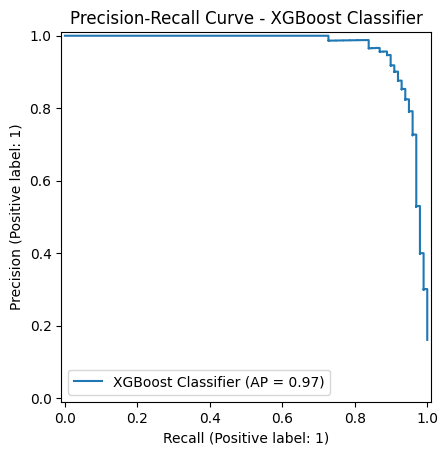

In [118]:
# Function to perform hyperparameter tuning
def tune_model(model, param_grid, model_name):
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")
    train_and_evaluate_model(best_model, model_name + " (Tuned)")

# Function to train and evaluate a model
def train_and_evaluate_model(model, model_name):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    
    print(f"Results for {model_name}:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Classification Report:\n", classification_report(y_test, y_pred))
    
    # Plot Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Plot Precision-Recall Curve
    try:
        y_pred_proba = model.predict_proba(X_test)[:, 1]
        PrecisionRecallDisplay.from_predictions(y_test, y_pred_proba, name=model_name)
        plt.title(f"Precision-Recall Curve - {model_name}")
        plt.show()
    except AttributeError:
        print(f"Warning: {model_name} does not support probability predictions.")
    
    print("\n" + "="*50 + "\n")

# Hyperparameter grids
param_grids = {
    "CART Classifier (Gini)": {
        'criterion': ['gini', 'entropy'],
        'max_depth': [None, 10, 20, 30, 50],
        'min_samples_split': [2, 5, 10]
    },
    "ID3 Classifier (Entropy)": {
        'criterion': ['entropy'],
        'max_depth': [None, 10, 20, 30, 50],
        'min_samples_split': [2, 5, 10]
    },
    "Extra Tree Classifier": {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10]
    },
    "Random Forest Classifier": {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10]
    },
    "Gradient Boosting Classifier": {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 10]
    },
    "AdaBoost Classifier with Decision Tree": {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.5, 1.0],
        'estimator__max_depth': [1, 2, 3, 5]
    }
}

# 1. CART (Classification and Regression Tree) - Gini impurity
cart_classifier = DecisionTreeClassifier(criterion='gini', random_state=42)
train_and_evaluate_model(cart_classifier, "CART Classifier (Gini)")

# 2. ID3 - Approximated using entropy as the criterion
id3_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
train_and_evaluate_model(id3_classifier, "ID3 Classifier (Entropy)")

# 3. C4.5 - Approximated using entropy, similar to ID3
c4_5_classifier = DecisionTreeClassifier(criterion='entropy', random_state=42)
train_and_evaluate_model(c4_5_classifier, "C4.5 Classifier Approximation")

# 4. Extra Tree Classifier (another variant of decision trees)
extra_tree_classifier = ExtraTreeClassifier(random_state=42)
train_and_evaluate_model(extra_tree_classifier, "Extra Tree Classifier")

# 5. Random Forest Classifier
random_forest_classifier = RandomForestClassifier(random_state=42)
train_and_evaluate_model(random_forest_classifier, "Random Forest Classifier")

# 6. Gradient Boosting Classifier
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)
train_and_evaluate_model(gradient_boosting_classifier, "Gradient Boosting Classifier")

# 7. AdaBoost Classifier (with a Decision Tree as the base estimator)
adaboost_classifier = AdaBoostClassifier(estimator=DecisionTreeClassifier(), random_state=42)
train_and_evaluate_model(adaboost_classifier, "AdaBoost Classifier with Decision Tree")

# 8. XGBoost Classifier
xgb_classifier = xgb.XGBClassifier(random_state=42)
train_and_evaluate_model(xgb_classifier, "XGBoost Classifier")

Results Analysis

Creating model comparison plot...


<Figure size 1500x800 with 0 Axes>

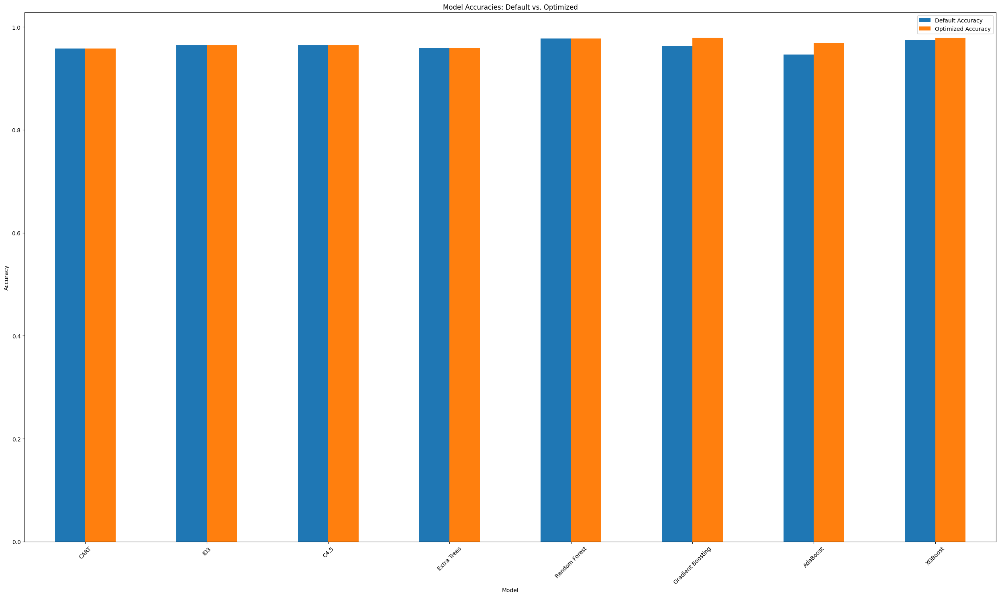


Creating feature importance visualizations...


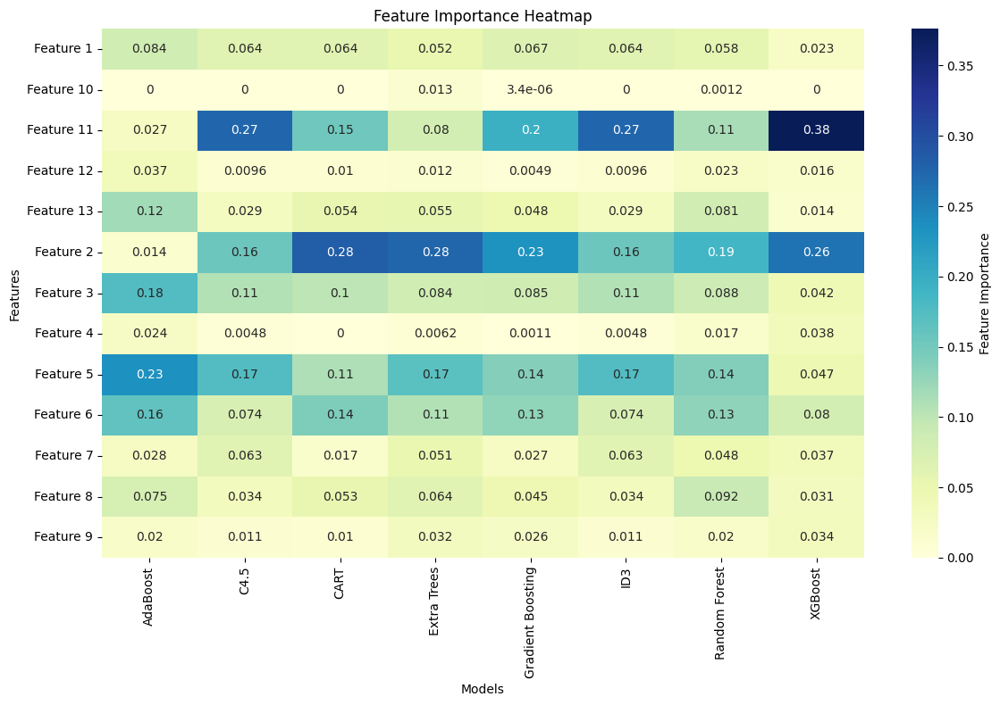

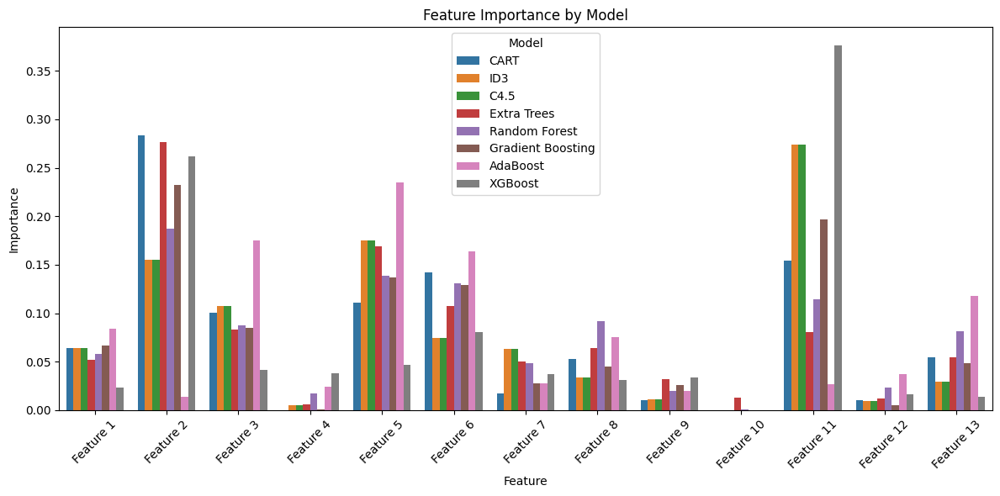

In [128]:


def create_model_comparison_plot(results_dict):
    """
    Creates a bar plot comparing accuracy scores across different models.
    """
    # Extract accuracies
    model_accuracies = []
    for model_name, result in results_dict.items():
        default_acc = result["Default"]["Accuracy"]
        optimized_acc = result["Optimized"]["Accuracy"]
        model_accuracies.append((model_name, default_acc, optimized_acc))
    
    # Create DataFrame for visualization
    accuracy_df = pd.DataFrame(model_accuracies, 
                             columns=["Model", "Default Accuracy", "Optimized Accuracy"])
    
    # Create plot
    plt.figure(figsize=(15, 8))
    accuracy_df.set_index("Model").plot(kind='bar', figsize=(25, 15))
    plt.title("Model Accuracies: Default vs. Optimized")
    plt.ylabel("Accuracy")
    plt.xticks(rotation=45)
    plt.legend(loc='best')
    plt.tight_layout()
    plt.show()
    
    return accuracy_df

def create_feature_importance_visualizations(results_dict, feature_names=None):
    """
    Creates feature importance heatmap and bar plots for tree-based models.
    """
    feature_importance_data = []
    
    for model_name, result in results_dict.items():
        if hasattr(result["Optimized"]["Best Estimator"], "feature_importances_"):
            feature_importance = result["Optimized"]["Best Estimator"].feature_importances_
            
            # Use provided feature names or generate default ones
            features = (feature_names if feature_names is not None 
                      else [f"Feature {i+1}" for i in range(len(feature_importance))])
            
            feature_importance_data.append(pd.DataFrame({
                "Feature": features,
                "Importance": feature_importance,
                "Model": model_name
            }))
    
    if not feature_importance_data:
        print("No feature importance data available for the provided models.")
        return None
    
    # Combine all feature importances
    feature_importance_df = pd.concat(feature_importance_data)
    
    # Create heatmap
    plt.figure(figsize=(12, 8))
    pivot_df = feature_importance_df.pivot(index="Feature", columns="Model", values="Importance")
    sns.heatmap(pivot_df, annot=True, cmap="YlGnBu", 
                cbar_kws={'label': 'Feature Importance'})
    plt.title("Feature Importance Heatmap")
    plt.ylabel("Features")
    plt.xlabel("Models")
    plt.tight_layout()
    plt.show()
    
    # Create bar plot
    plt.figure(figsize=(12, 6))
    sns.barplot(data=feature_importance_df, x="Feature", y="Importance", hue="Model")
    plt.title("Feature Importance by Model")
    plt.xticks(rotation=45)
    plt.ylabel("Importance")
    plt.tight_layout()
    plt.show()
    
    return feature_importance_df


# Main execution section
if __name__ == "__main__":
    # Step 1: Create model comparison plot
    print("Creating model comparison plot...")
    accuracy_df = create_model_comparison_plot(results)
    
    # Step 2: Create feature importance visualizations
    print("\nCreating feature importance visualizations...")
    # If you have feature names, uncomment and modify the next line:
    # feature_names = ['your_feature_names_here']
    # importance_df = create_feature_importance_visualizations(results, feature_names)
    importance_df = create_feature_importance_visualizations(results)
    
   

Visualizing CART (Gini) Tree:

Full Depth Tree Visualization:


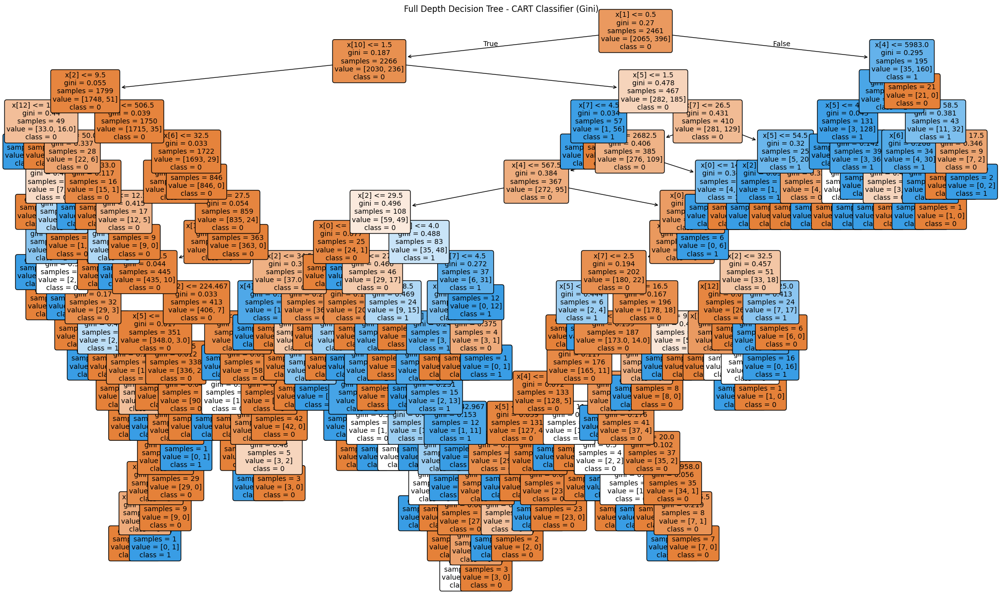


Limited Depth (max_depth=4) Tree Visualization:


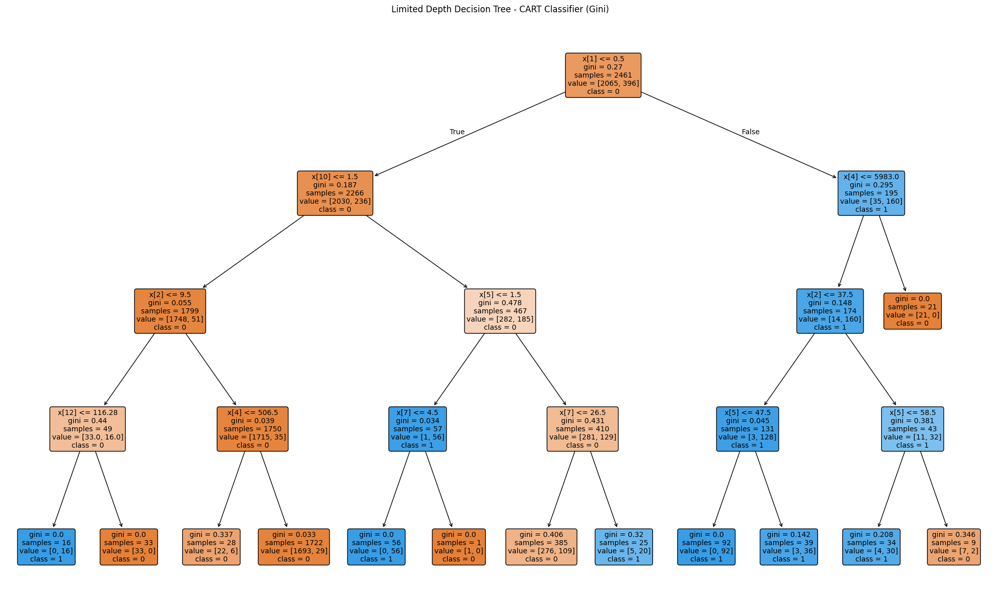


Visualizing ID3 (Entropy) Tree:

Full Depth Tree Visualization:


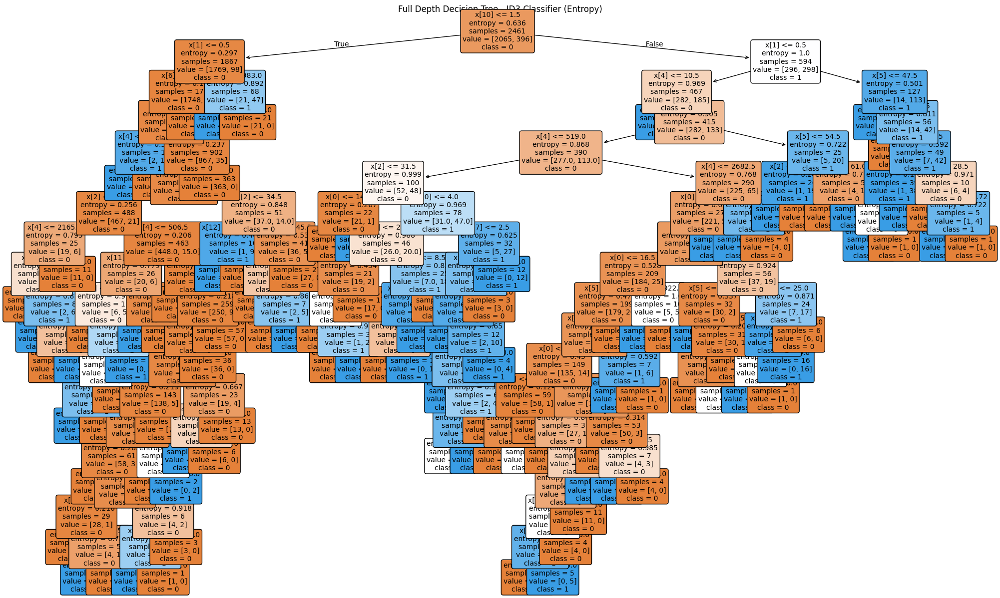


Limited Depth (max_depth=4) Tree Visualization:


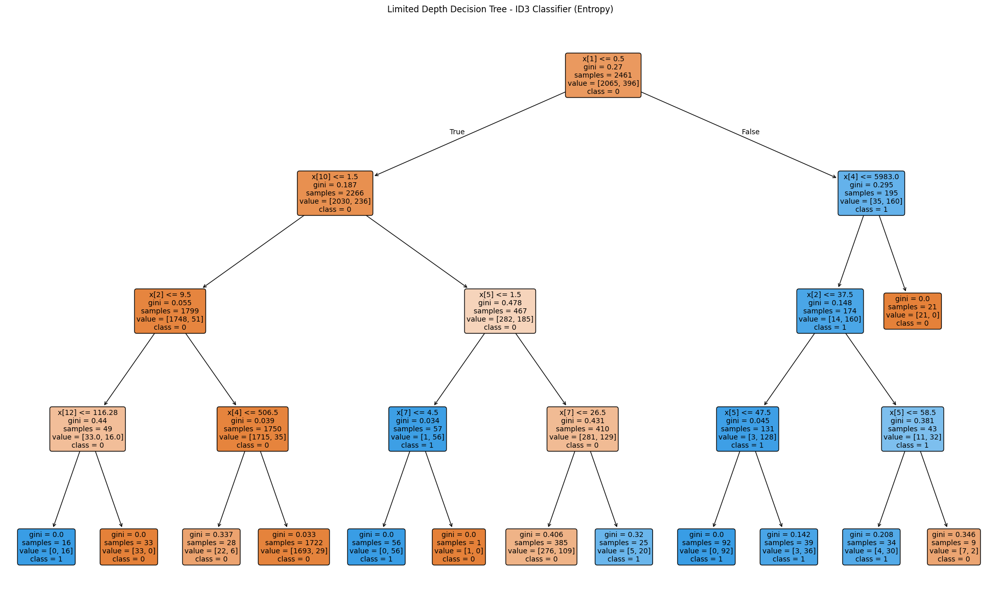


Visualizing C4.5 Tree:

Full Depth Tree Visualization:


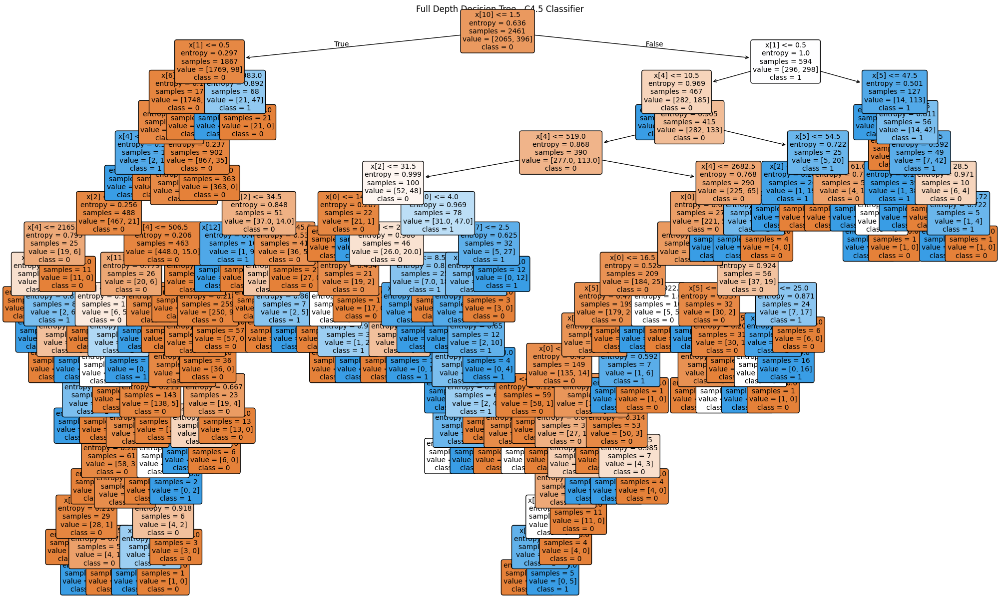


Limited Depth (max_depth=4) Tree Visualization:


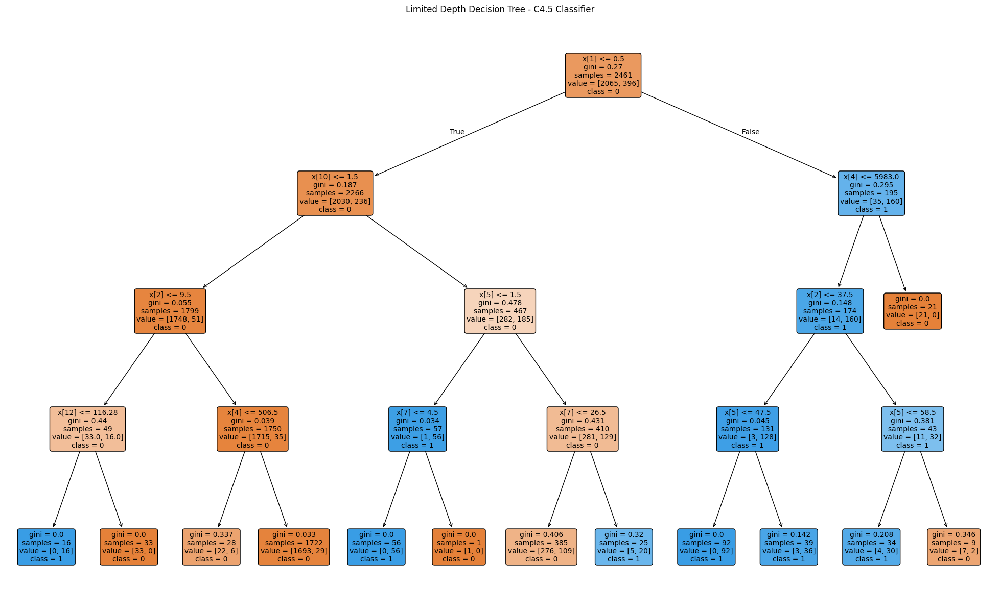


Visualizing Extra Tree:

Full Depth Tree Visualization:


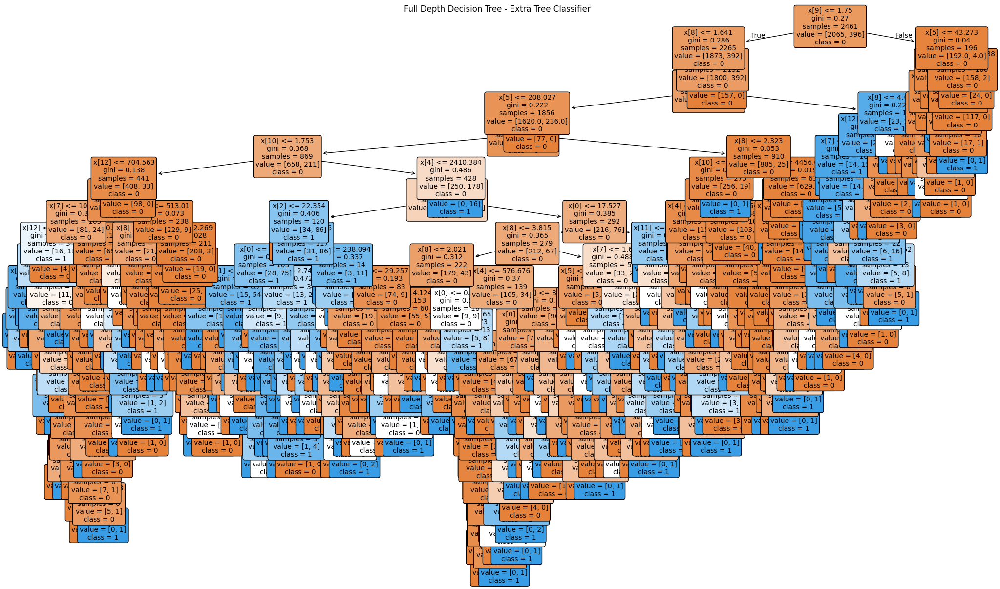


Limited Depth (max_depth=4) Tree Visualization:


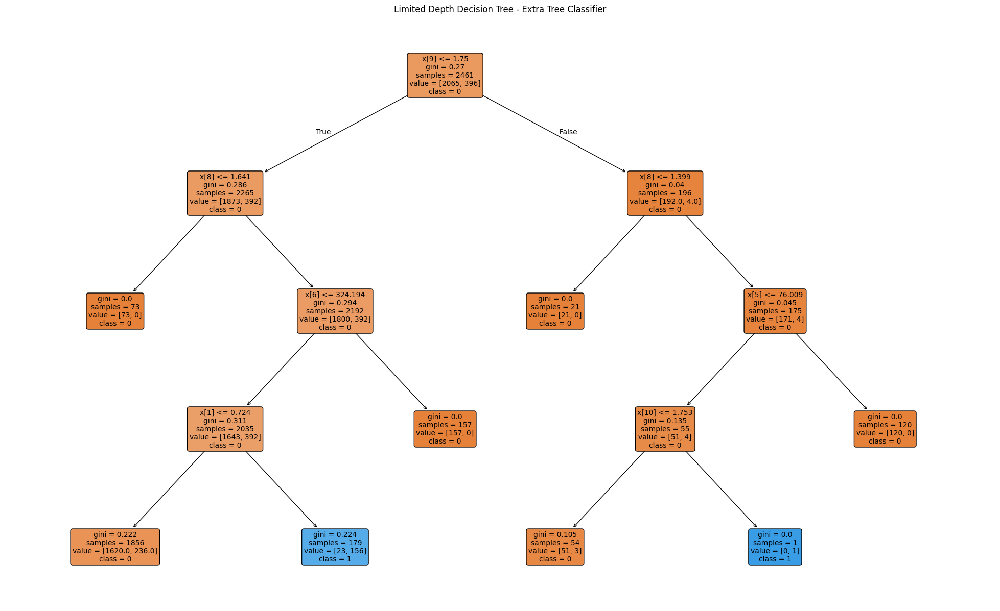


Visualizing Random Forest Tree:

Full Depth Sample Tree Visualization:


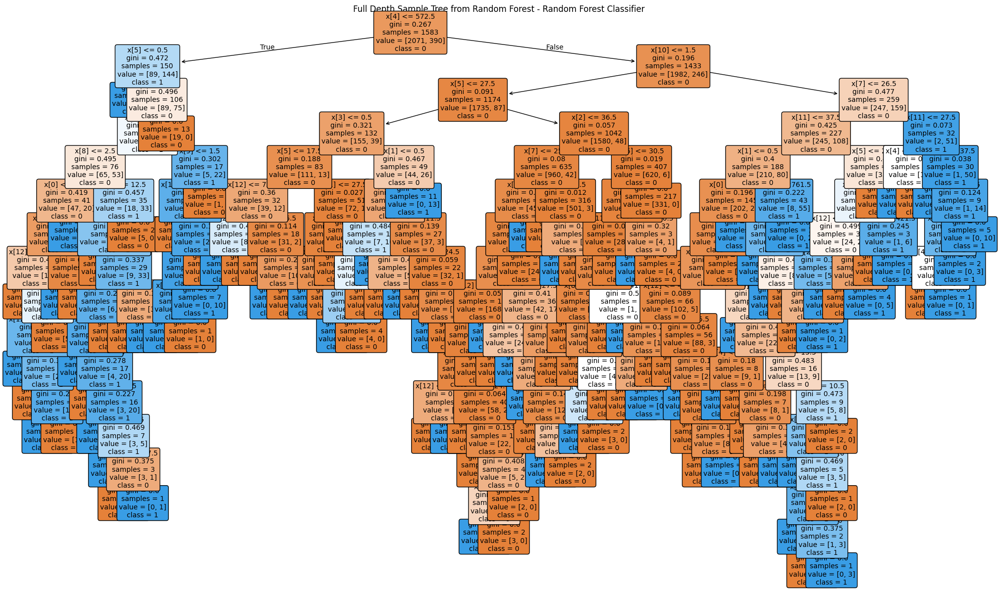


Limited Depth (max_depth=4) Sample Tree Visualization:


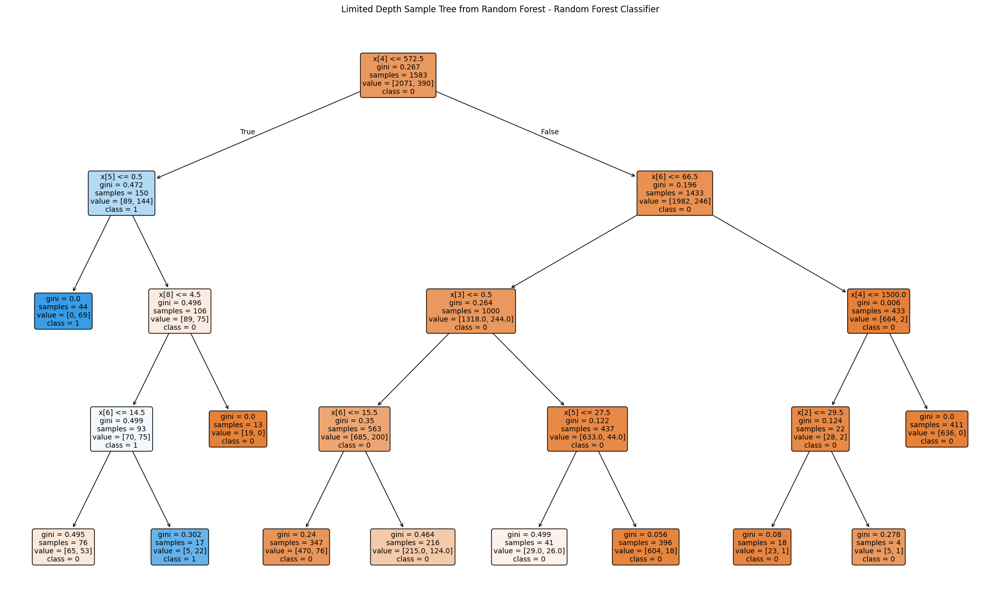


Visualizing Gradient Boosting Tree:

Full Depth Sample Tree Visualization:


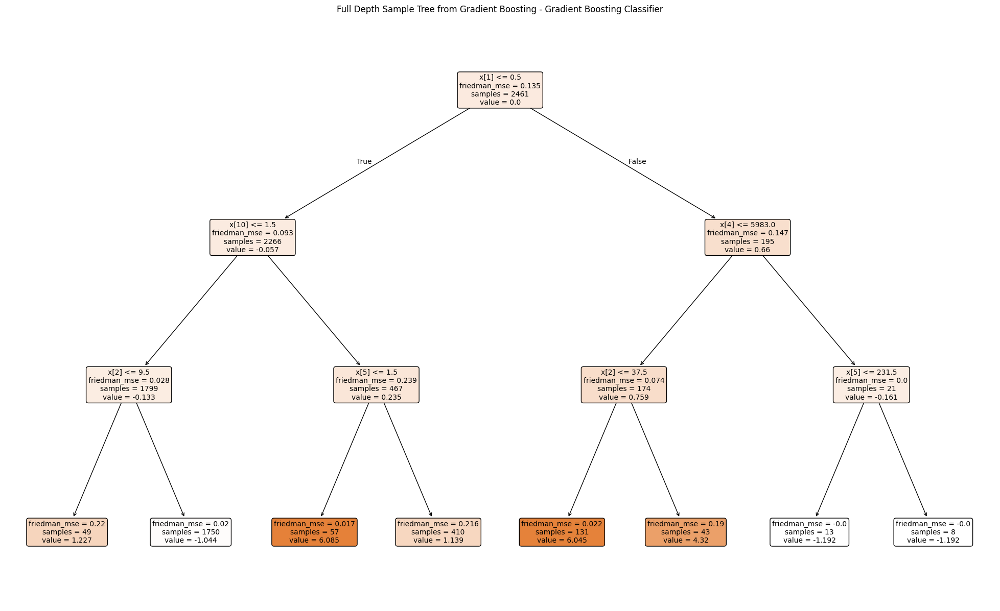


Limited Depth (max_depth=4) Sample Tree Visualization:


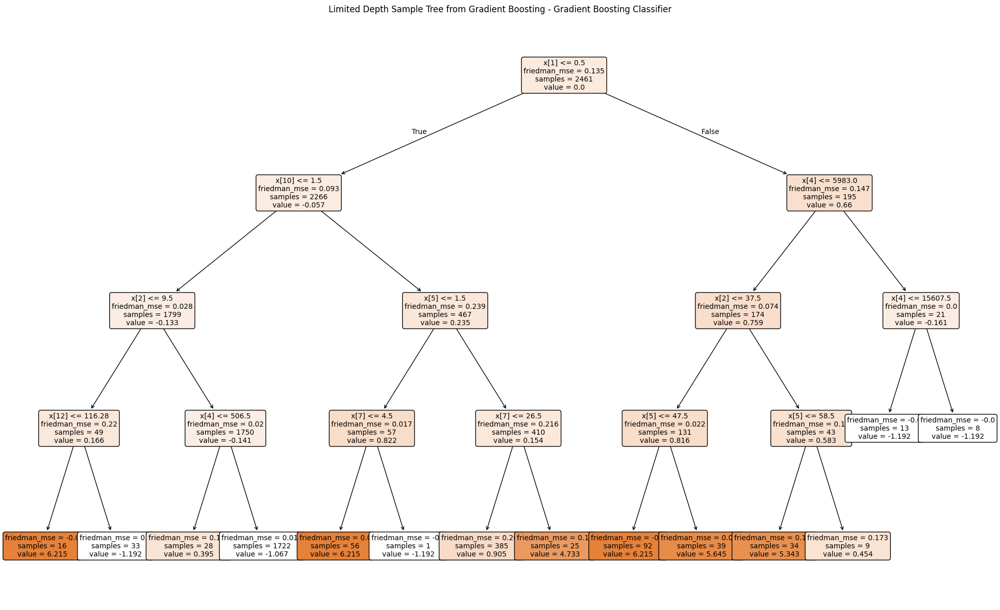


Visualizing AdaBoost Tree:

Full Depth Sample Tree Visualization:


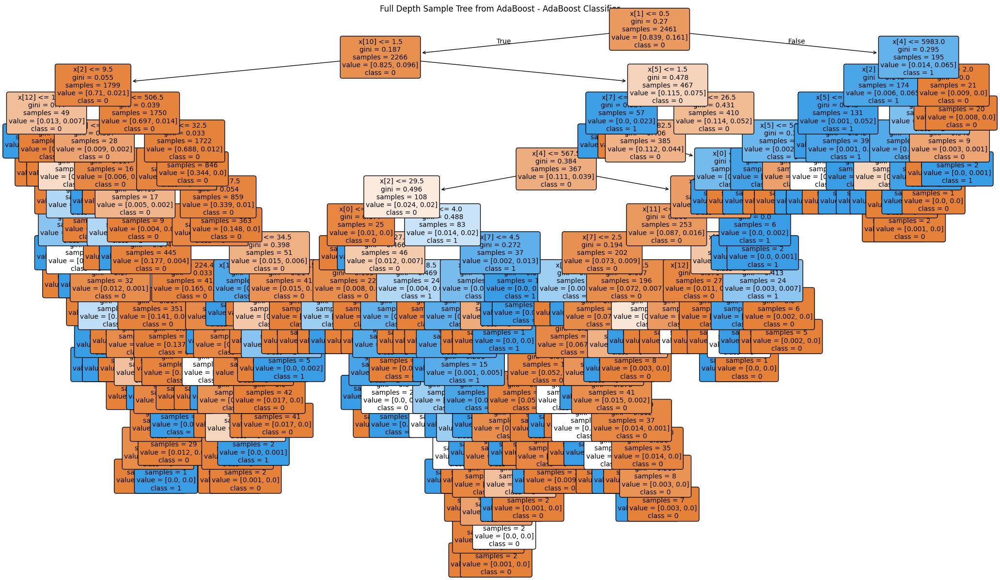

c:\Users\Administrator\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(



Limited Depth (max_depth=4) Sample Tree Visualization:


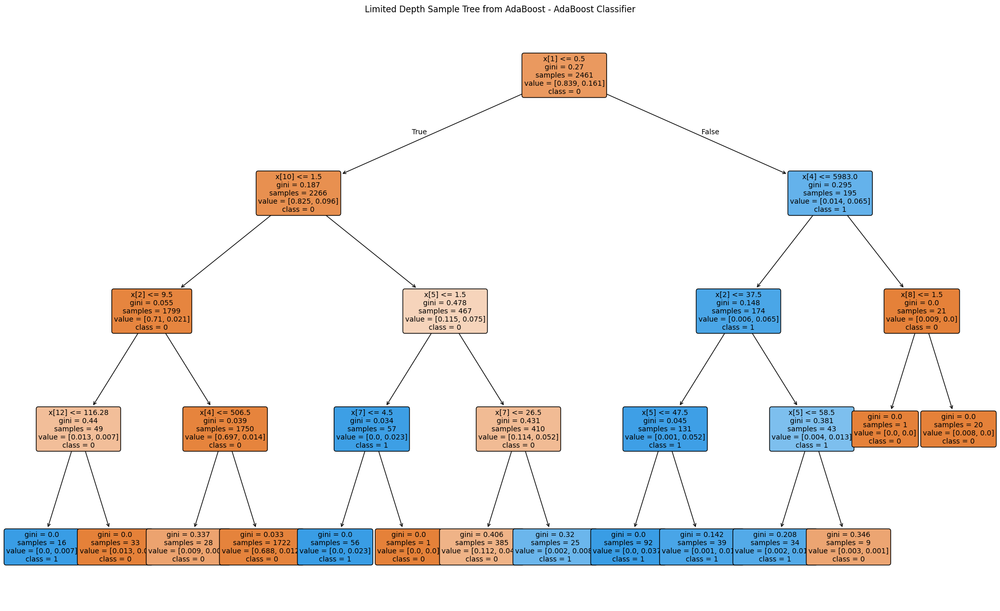

In [129]:

def visualize_model_tree(model, model_name, X_train, y_train, create_limited_tree=True):
    """
    Visualize decision trees for various tree-based models.
    Assumes the model is already trained.
    """
    # Tree Visualization Function
    def visualize_tree(tree_model, title_prefix=""):
        plt.figure(figsize=(25, 15))
        plot_tree(tree_model, 
                 feature_names=X_train.columns if hasattr(X_train, 'columns') else None,
                 class_names=[str(c) for c in np.unique(y_train)],
                 filled=True,
                 rounded=True,
                 fontsize=10)
        plt.title(f"{title_prefix} {model_name}")
        plt.show()

    # Visualization logic for different model types
    if isinstance(model, DecisionTreeClassifier) or isinstance(model, ExtraTreeClassifier):
        print("\nFull Depth Tree Visualization:")
        visualize_tree(model, "Full Depth Decision Tree -")
        
        if create_limited_tree:
            limited_model = type(model)(random_state=42, max_depth=4)
            limited_model.fit(X_train, y_train)
            print("\nLimited Depth (max_depth=4) Tree Visualization:")
            visualize_tree(limited_model, "Limited Depth Decision Tree -")
    
    elif isinstance(model, RandomForestClassifier):
        print("\nFull Depth Sample Tree Visualization:")
        visualize_tree(model.estimators_[0], "Full Depth Sample Tree from Random Forest -")
        
        if create_limited_tree:
            limited_model = RandomForestClassifier(random_state=42, max_depth=4)
            limited_model.fit(X_train, y_train)
            print("\nLimited Depth (max_depth=4) Sample Tree Visualization:")
            visualize_tree(limited_model.estimators_[0], "Limited Depth Sample Tree from Random Forest -")
    
    elif isinstance(model, GradientBoostingClassifier):
        print("\nFull Depth Sample Tree Visualization:")
        visualize_tree(model.estimators_[0][0], "Full Depth Sample Tree from Gradient Boosting -")
        
        if create_limited_tree:
            limited_model = GradientBoostingClassifier(random_state=42, max_depth=4)
            limited_model.fit(X_train, y_train)
            print("\nLimited Depth (max_depth=4) Sample Tree Visualization:")
            visualize_tree(limited_model.estimators_[0][0], "Limited Depth Sample Tree from Gradient Boosting -")
    
    elif isinstance(model, AdaBoostClassifier):
        print("\nFull Depth Sample Tree Visualization:")
        visualize_tree(model.estimators_[0], "Full Depth Sample Tree from AdaBoost -")
        
        if create_limited_tree:
            limited_model = AdaBoostClassifier(
                estimator=DecisionTreeClassifier(max_depth=4),
                random_state=42
            )
            limited_model.fit(X_train, y_train)
            print("\nLimited Depth (max_depth=4) Sample Tree Visualization:")
            visualize_tree(limited_model.estimators_[0], "Limited Depth Sample Tree from AdaBoost -")
    
    elif isinstance(model, xgb.XGBClassifier):
        print("\nFull Depth Tree Visualization:")
        plt.figure(figsize=(25, 15))
        xgb.plot_tree(model, num_trees=0)
        plt.title(f"Full Depth First Tree from XGBoost - {model_name}")
        plt.show()
        
        if create_limited_tree:
            limited_model = xgb.XGBClassifier(random_state=42, max_depth=4)
            limited_model.fit(X_train, y_train)
            print("\nLimited Depth (max_depth=4) Tree Visualization:")
            plt.figure(figsize=(25, 15))
            xgb.plot_tree(limited_model, num_trees=0)
            plt.title(f"Limited Depth First Tree from XGBoost - {model_name}")
            plt.show()

# Then call the function for each model
# Assuming your models are already trained:

print("Visualizing CART (Gini) Tree:")
visualize_model_tree(cart_classifier, "CART Classifier (Gini)", X_train, y_train)

print("\nVisualizing ID3 (Entropy) Tree:")
visualize_model_tree(id3_classifier, "ID3 Classifier (Entropy)", X_train, y_train)

print("\nVisualizing C4.5 Tree:")
visualize_model_tree(c4_5_classifier, "C4.5 Classifier", X_train, y_train)

print("\nVisualizing Extra Tree:")
visualize_model_tree(extra_tree_classifier, "Extra Tree Classifier", X_train, y_train)

print("\nVisualizing Random Forest Tree:")
visualize_model_tree(random_forest_classifier, "Random Forest Classifier", X_train, y_train)

print("\nVisualizing Gradient Boosting Tree:")
visualize_model_tree(gradient_boosting_classifier, "Gradient Boosting Classifier", X_train, y_train)

print("\nVisualizing AdaBoost Tree:")
visualize_model_tree(adaboost_classifier, "AdaBoost Classifier", X_train, y_train)


Model Rules

In [131]:


def extract_rules_from_tree(model, model_name, feature_names):
    """
    Extract and display rules from a decision tree or tree-based model.
    For ensemble models, rules are extracted from individual trees.
    
    Args:
    - model: The trained model.
    - model_name: Name of the model (for display purposes).
    - feature_names: List of feature names (for meaningful rules).
    """
    print(f"Rules for {model_name}:")
    if isinstance(model, DecisionTreeClassifier) or isinstance(model, ExtraTreeClassifier):
        # Extract rules for single decision trees
        rules = export_text(model, feature_names=feature_names)
        print(rules)
    
    elif isinstance(model, RandomForestClassifier):
        # Extract rules from each tree in the Random Forest
        for i, tree in enumerate(model.estimators_[:3]):  # Show rules from the first 3 trees
            print(f"\nRules for Tree {i + 1} in Random Forest:")
            rules = export_text(tree, feature_names=feature_names)
            print(rules)
    
    elif isinstance(model, GradientBoostingClassifier):
        # Extract rules from each tree in Gradient Boosting
        for i, tree in enumerate(model.estimators_[:3, 0]):  # Show rules from the first 3 trees
            print(f"\nRules for Tree {i + 1} in Gradient Boosting:")
            rules = export_text(tree, feature_names=feature_names)
            print(rules)
    
    elif isinstance(model, AdaBoostClassifier):
        # Extract rules from each tree in AdaBoost
        for i, tree in enumerate(model.estimators_[:3]):  # Show rules from the first 3 trees
            print(f"\nRules for Tree {i + 1} in AdaBoost:")
            rules = export_text(tree, feature_names=feature_names)
            print(rules)
    
    elif isinstance(model, xgb.XGBClassifier):
        # Extract rules for XGBoost trees
        print("XGBoost models use binary splits; consider visualizing the model.")
        for i in range(3):  # Show rules for the first 3 trees
            print(f"\nRules for Tree {i + 1} in XGBoost:")
            print(model.get_booster().trees_to_dataframe(tree_index=i).to_string(index=False))
    else:
        print(f"Rule extraction is not supported for {model_name}.")
    print("\n" + "="*50 + "\n")


# Example: Extracting rules from your models
feature_names = X_train.columns if hasattr(X_train, 'columns') else [f"Feature {i}" for i in range(X_train.shape[1])]

extract_rules_from_tree(cart_classifier, "CART Classifier (Gini)", feature_names)
extract_rules_from_tree(id3_classifier, "ID3 Classifier (Entropy)", feature_names)
extract_rules_from_tree(extra_tree_classifier, "Extra Tree Classifier", feature_names)
extract_rules_from_tree(random_forest_classifier, "Random Forest Classifier", feature_names)
extract_rules_from_tree(gradient_boosting_classifier, "Gradient Boosting Classifier", feature_names)
extract_rules_from_tree(adaboost_classifier, "AdaBoost Classifier with Decision Tree", feature_names)



Rules for CART Classifier (Gini):
|--- Feature 1 <= 0.50
|   |--- Feature 10 <= 1.50
|   |   |--- Feature 2 <= 9.50
|   |   |   |--- Feature 12 <= 116.28
|   |   |   |   |--- class: 1
|   |   |   |--- Feature 12 >  116.28
|   |   |   |   |--- class: 0
|   |   |--- Feature 2 >  9.50
|   |   |   |--- Feature 4 <= 506.50
|   |   |   |   |--- Feature 11 <= 50.00
|   |   |   |   |   |--- Feature 2 <= 34.00
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- Feature 2 >  34.00
|   |   |   |   |   |   |--- Feature 7 <= 7.00
|   |   |   |   |   |   |   |--- Feature 2 <= 38.50
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |--- Feature 2 >  38.50
|   |   |   |   |   |   |   |   |--- Feature 0 <= 5.50
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- Feature 0 >  5.50
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- Feature 7 >  7.00
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |